In [1]:
import numpy as np
import pandas as pd
import xarray as xr
from glob import glob
import os
import rioxarray as rio
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.ticker import PercentFormatter
import matplotlib.colors as colors
from geodatasets import get_path
import geopandas as gpd
path = get_path("naturalearth.land")
world_df = gpd.read_file(path)
from matplotlib import patches
import seaborn as sns
from shapely.geometry import Polygon

#import interp1d
from scipy.interpolate import interp1d,UnivariateSpline
from datetime import datetime
from scipy.optimize import curve_fit
from matplotlib import gridspec
from brokenaxes import brokenaxes


/home/cfranken/.conda/envs/ee/lib/python3.12/site-packages/pandas/core/arrays/masked.py:61: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
OCO2_L1B = xr.concat([xr.open_dataset(f,engine="scipy")['__xarray_dataarray_variable__'] for f in glob(f"/kiwi-data/Data/groupMembers/ymbaron/cloud_effect/results/01_calc_OCO_yield/*{'L1B'}*binned_no_sza.nc")], dim="orbits")


TypeError: Error: /kiwi-data/Data/groupMembers/ymbaron/cloud_effect/results/01_calc_OCO_yield/OCO2_L1B_Science_11r_2018_binned_no_sza.nc is not a valid NetCDF 3 file
            If this is a NetCDF4 file, you may need to install the
            netcdf4 library, e.g.,

            $ pip install netcdf4
            

### Load OCO-2 data

In [ ]:
OCO2_L1B = xr.concat([xr.open_dataset(f,engine="h5netcdf")['__xarray_dataarray_variable__'] for f in glob(f"/kiwi-data/Data/groupMembers/ymbaron/cloud_effect/results/01_calc_OCO_yield/*{'L1B'}*binned_no_sza.nc")], dim="orbits")
OCO2_L2 = xr.concat([xr.open_dataset(f,engine="h5netcdf")['__xarray_dataarray_variable__'] for f in glob(f"/kiwi-data/Data/groupMembers/ymbaron/cloud_effect/results/01_calc_OCO_yield/*{'L2'}*binned.nc")], dim="orbits")
OCO2_L2_raw = xr.concat([xr.open_dataset(f,engine="h5netcdf")['__xarray_dataarray_variable__'] for f in glob(f"/kiwi-data/Data/groupMembers/ymbaron/cloud_effect/results/01_calc_OCO_yield/*{'L2'}*unfiltered.nc")], dim="orbits")

TypeError: Error: /kiwi-data/Data/groupMembers/ymbaron/cloud_effect/results/01_calc_OCO_yield/OCO2_L1B_Science_11r_2018_binned_no_sza.nc is not a valid NetCDF 3 file
            If this is a NetCDF4 file, you may need to install the
            netcdf4 library, e.g.,

            $ pip install netcdf4
            

In [3]:
OCO2_L1B.rio.write_crs("epsg:4326", inplace=True);
OCO2_L2.rio.write_crs("epsg:4326", inplace=True);
OCO2_L2_raw.rio.write_crs("epsg:4326", inplace=True);

In [4]:
OCO2_L2_monthly = OCO2_L2.groupby('time.month').sum(dim='orbits')
OCO2_L2_raw_monthly = OCO2_L2_raw.groupby('time.month').sum(dim='orbits')
OCO2_L1B_monthly = OCO2_L1B.groupby('time.month').sum(dim='orbits')
OCO2_Yield = (OCO2_L2_monthly +1e-10) / OCO2_L1B_monthly
OCO2_Yield_raw = (OCO2_L2_raw_monthly +1e-10) / OCO2_L1B_monthly
OCO2_Yield_annual = (OCO2_L2_monthly.sum(dim='month')+ 1e-10)/OCO2_L1B_monthly.sum(dim='month') 


In [5]:
month_bins = np.arange(0,13,3)
OCO2_L2['month_shifted'] = OCO2_L2['time.month'] % 12
OCO2_L1B['month_shifted'] = OCO2_L1B['time.month'] % 12
OCO2_L1B_seasonal = OCO2_L1B.groupby_bins('month_shifted', bins=month_bins,right=False,labels=['DJF','MAM','JJA','SON']).sum(dim='orbits')
OCO2_L2_seasonal = OCO2_L2.groupby_bins('month_shifted', bins=month_bins,right=False,labels=['DJF','MAM','JJA','SON']).sum(dim='orbits')
# OCO2_seasonal_yield = (OCO2_L2_seasonal +1e-10) / (OCO2_L1B_seasonal+1e-10)
OCO2_seasonal_yield = ((OCO2_L2_seasonal +1e-10) / (OCO2_L1B_seasonal)).fillna(1e-10)
OCO2_seasonal_yield = OCO2_seasonal_yield.rename({'month_shifted_bins':'season'})

In [6]:
path = get_path("naturalearth.land")
world_df = gpd.read_file(path)

### Load OCO-3 data

In [7]:
def calc_hourly_N(fn,basin=False):
    print(fn)
    cols = ['x','y','hour']
    ds = pd.read_feather(fn).dropna()[cols].groupby(cols,observed=True).size()#.to_xarray()
    return ds

In [8]:
OCO3_L1B_files = glob('/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L1B_Science_10r_*.feather')
OCO3_L1B = pd.concat([calc_hourly_N(f) for f in OCO3_L1B_files])
OCO3_L1B = OCO3_L1B.reset_index(name='N')
OCO3_L1B['hour_cor'] = (OCO3_L1B['hour'] + ((OCO3_L1B['x'].astype(int)+7.5)/15).astype(int).values) % 24
OCO3_L1B_hourly=OCO3_L1B.groupby(['y','x','hour_cor'],observed=False)['N'].sum().to_xarray()

/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L1B_Science_10r_2019.feather


/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L1B_Science_10r_2020.feather
/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L1B_Science_10r_2021.feather
/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L1B_Science_10r_2022.feather


In [9]:
OCO3_L2_files = glob('/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_*.feather')
OCO3_L2_files = [f for f in OCO3_L2_files if 'unfiltered' not in f]
OCO3_L2 = pd.concat([calc_hourly_N(f) for f in OCO3_L2_files])
OCO3_L2 = OCO3_L2.reset_index(name='N')
OCO3_L2['hour_cor'] = (OCO3_L2['hour'] + ((OCO3_L2['x'].astype(int)+7.5)/15).astype(int).values) % 24
OCO3_L2_hourly=OCO3_L2.groupby(['y','x','hour_cor'],observed=False)['N'].sum().to_xarray()


/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_Lite_FP_10.4r_2019.feather
/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_Lite_FP_10.4r_2020.feather
/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_Lite_FP_10.4r_2021.feather
/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_Lite_FP_10.4r_2022.feather


In [10]:
OCO3_L2_files_raw = glob('/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_*unfiltered.feather')
OCO3_L2_raw = pd.concat([calc_hourly_N(f) for f in OCO3_L2_files_raw])
OCO3_L2_raw = OCO3_L2_raw.reset_index(name='N')
OCO3_L2_raw['hour_cor'] = (OCO3_L2_raw['hour'] + ((OCO3_L2_raw['x'].astype(int)+7.5)/15).astype(int).values) % 24
OCO3_L2_hourly_raw=OCO3_L2_raw.groupby(['y','x','hour_cor'],observed=False)['N'].sum().to_xarray()


/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_Lite_FP_10.4r_2019_unfiltered.feather
/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_Lite_FP_10.4r_2020_unfiltered.feather
/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_Lite_FP_10.4r_2021_unfiltered.feather
/net/fluo/data2/groupMembers/ymbaron/cloud_effect/results/03_calc_OCO3_yield/OCO3_L2_Lite_FP_10.4r_2022_unfiltered.feather


### Load S2 data

In [5]:
month_bins = np.arange(0,13,3)
# S2_df = pd.read_feather('~/data/cloud_effect/GE_output.feather')
S2_df = pd.read_feather('/home/ymbaron//data/cloud_effect/GE_output_v2.feather')
S2_df['season'] = pd.cut(S2_df['time'].dt.month % 12, bins=month_bins,right=False,labels=['DJF','MAM','JJA','SON'])
S2_df['dry'] = S2_df['time'].dt.month.between(5,9)

In [12]:
S2_season_mean = S2_df.groupby(['lat','lon','season','res'])[['cloud_free_fraction1','cloud_free_fraction5']].mean().to_xarray()
S2_season_median = S2_df.groupby(['lat','lon','season','res'])[['cloud_free_fraction1','cloud_free_fraction5']].median().to_xarray()

new_coords = {'x':np.arange(-180,180),'y':np.arange(-90,90)}
S2_season_mean = S2_season_mean.rename({'lat':'y','lon':'x'}).reindex(new_coords,fill_value=np.nan)
S2_season_mean.rio.write_crs("epsg:4326", inplace=True);
S2_season_mean = S2_season_mean.rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')

S2_season_median = S2_season_median.rename({'lat':'y','lon':'x'}).reindex(new_coords,fill_value=np.nan)
S2_season_median.rio.write_crs("epsg:4326", inplace=True);
S2_season_median=S2_season_median.rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')

/tmp/ipykernel_2693206/3940370336.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  S2_season_mean = S2_df.groupby(['lat','lon','season','res'])[['cloud_free_fraction1','cloud_free_fraction5']].mean().to_xarray()
/tmp/ipykernel_2693206/3940370336.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  S2_season_median = S2_df.groupby(['lat','lon','season','res'])[['cloud_free_fraction1','cloud_free_fraction5']].median().to_xarray()


Load data at 0.2%

In [2]:
month_bins = np.arange(0,13,3)
# S2_df = pd.read_feather('~/data/cloud_effect/GE_output.feather')
S2_df02 = pd.read_feather('/home/ymbaron//data/cloud_effect/GE_output_0.2.feather')
S2_df02['season'] = pd.cut(S2_df02['time'].dt.month % 12, bins=month_bins,right=False,labels=['DJF','MAM','JJA','SON'])
S2_df02['dry'] = S2_df02['time'].dt.month.between(5,9)

In [14]:
month_bins = np.arange(0,13,3)
# S2_df = pd.read_feather('~/data/cloud_effect/GE_output.feather')
S2_df_final = pd.read_feather('/home/ymbaron//data/cloud_effect/GE_output_final.feather')
# S2_df_final['season'] = pd.cut(S2_df_final['time'].dt.month % 12, bins=month_bins,right=False,labels=['DJF','MAM','JJA','SON'])
S2_df_final.loc[S2_df_final['time'].dt.month.between(7,9),'dry_wet'] = 'dry'
S2_df_final.loc[S2_df_final['time'].dt.month.isin([12,1,2,3,4,5]),'dry_wet'] = 'wet'
# S2_df_final['dry'] = S2_df_final['time'].dt.month.between(5,9)

In [15]:
S2_season_mean02 = S2_df02.groupby(['lat','lon','season','res'])[['cloud_free_fraction02','cloud_free_fraction1']].mean().to_xarray()
S2_season_median02 = S2_df02.groupby(['lat','lon','season','res'])[['cloud_free_fraction02','cloud_free_fraction1']].median().to_xarray()
S2_season_75  = S2_df02.groupby(['lat','lon','season','res'])[['cloud_free_fraction02','cloud_free_fraction1']].quantile(0.75).to_xarray() 

new_coords = {'x':np.arange(-180,180),'y':np.arange(-90,90)}
S2_season_mean02 = S2_season_mean02.rename({'lat':'y','lon':'x'}).reindex(new_coords,fill_value=np.nan)
S2_season_mean02.rio.write_crs("epsg:4326", inplace=True);
S2_season_mean02 = S2_season_mean02.rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')

S2_season_median02 = S2_season_median02.rename({'lat':'y','lon':'x'}).reindex(new_coords,fill_value=np.nan)
S2_season_median02.rio.write_crs("epsg:4326", inplace=True);
S2_season_median02=S2_season_median02.rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')

S2_season_75  = S2_season_75.rename({'lat':'y','lon':'x'}).reindex(new_coords,fill_value=np.nan)
S2_season_75.rio.write_crs("epsg:4326", inplace=True);
S2_season_75 =S2_season_75 .rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')

/tmp/ipykernel_2693206/86083778.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  S2_season_mean02 = S2_df02.groupby(['lat','lon','season','res'])[['cloud_free_fraction02','cloud_free_fraction1']].mean().to_xarray()


/tmp/ipykernel_2693206/86083778.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  S2_season_median02 = S2_df02.groupby(['lat','lon','season','res'])[['cloud_free_fraction02','cloud_free_fraction1']].median().to_xarray()
/tmp/ipykernel_2693206/86083778.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  S2_season_75  = S2_df02.groupby(['lat','lon','season','res'])[['cloud_free_fraction02','cloud_free_fraction1']].quantile(0.75).to_xarray()


### Figure 1 - seasonal maps

In [24]:
def make_fig1v2():
    fig, axs = plt.subplot_mosaic([
    ['all_regions','all_regions'],
    ['JJA','DJF']
    ], layout='constrained',subplot_kw={'projection': ccrs.Robinson()},figsize=(8,6),dpi=300,gridspec_kw={'hspace':0.0001,'wspace':0.})

    bounds = np.linspace(0, 1, 32)
    norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)
    # Create a colormap
    cmap = plt.get_cmap('viridis', len(bounds)-1)
    axs['all_regions'].set_extent([-179.9, 179.9, -60, 75], crs=ccrs.PlateCarree())
    f = OCO2_Yield_annual.plot(norm=colors.LogNorm(vmin=1e-3, vmax=1),transform=ccrs.PlateCarree(),cmap=cmap,rasterized=True,ax=axs['all_regions'],add_colorbar=False)
    # f = OCO2_Yield_annual.plot(norm=colors.LogNorm(vmin=1e-3, vmax=1),transform=ccrs.PlateCarree(),cmap=cmap,cbar_kwargs={'pad':100,'orientation':'horizontal','label':''},ax=axs['all_regions'])
    axs['all_regions'].coastlines(lw=2)
    axs['all_regions'].gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    # cbar = f.colorbar

    
    axs['all_regions'].set_title('OCO-2 mean annual data yield for years 2018-2022',fontsize=10,)

    for season in ['JJA','DJF']:
        axs[season].set_extent([-179.9, 179.9, -60, 75], crs=ccrs.PlateCarree())
        OCO2_seasonal_yield.sel(season=season).plot(ax=axs[season],norm=colors.LogNorm(vmin=1e-3, vmax=1),transform=ccrs.PlateCarree(),cmap=cmap,rasterized=True,add_colorbar=False)
        axs[season].set_title(f'month = {season}',fontsize=10)
        axs[season].coastlines(lw=2)

        # axs[season].gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    axs['all_regions'].text(-0.18, 1.05, 'A', transform=axs['all_regions'].transAxes, fontsize=13, fontweight='bold', va='top')
    axs['JJA'].text(0., 1.05, "B", transform=axs['JJA'].transAxes, fontsize=13, fontweight='bold', va='top')
    axs['DJF'].text(0., 1.05, "C", transform=axs['DJF'].transAxes, fontsize=13, fontweight='bold', va='top')
    axs['all_regions'].set_position([0., 0.5, 1., 0.4])     
    cbar = fig.colorbar(f, ax=list(axs.values())[1:], orientation='horizontal', pad=0.05, aspect=60,extend='min')
    cbar.set_ticklabels([f'{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )
    cbar.set_ticklabels([f'{"" if i*100 %1 !=0 else ""}{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )
    return fig

/tmp/ipykernel_3939700/1106469901.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )
/tmp/ipykernel_3939700/1106469901.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'{"" if i*100 %1 !=0 else ""}{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )


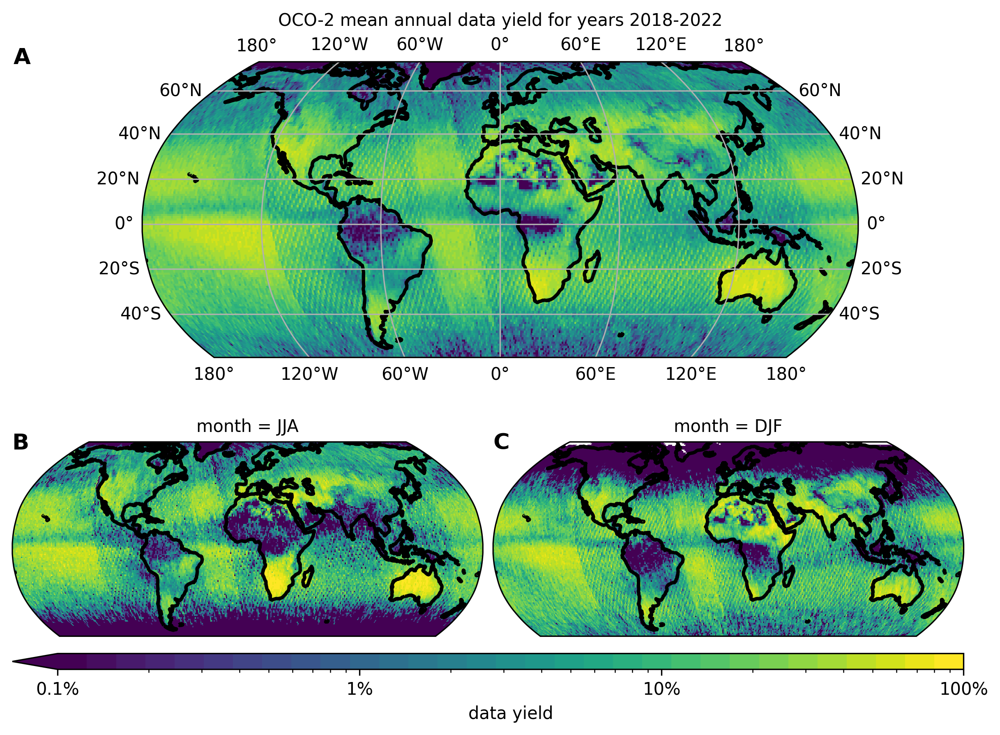

In [28]:
fig =  make_fig1v2()
d = datetime.today().strftime('%Y-%m-%d')
# fig.savefig(f"../figures/fig_01v2_{d}.png",dpi=300)
# fig.savefig(f"../figures/fig_01v2_{d}.pdf",dpi=300)


### Figure 2 - S2 and OCO-2 seasonal maps with 0.2% threshold

In [14]:
def plot_fig2(extent=[-85, -30, -19, 14],mean=S2_season_mean02,median=S2_season_median02,label='cloud_free_fraction02',h=0.15,w=0.15,hspace=0.15,wspace=0.16):
    OCO2_seasonal_yield2 = OCO2_seasonal_yield.rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')

    # Create a colormap
    bounds = np.linspace(0, 1, 13)
    norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)
    cmap = plt.get_cmap('viridis', len(bounds)-1)
    cmap2 = plt.get_cmap('inferno', len(bounds)-1)

    # map
    fig = plt.figure(dpi=300,figsize=(10,8))
    gs = gridspec.GridSpec(5,4)
    axs = np.empty([4,5],dtype=object)

    for i,ds in enumerate([OCO2_seasonal_yield2,mean.sel(res=2000)[label],median.sel(res=2000)[label]+1e-10,median.sel(res=200)[label]+1e-10,median.sel(res=200)[label]+1e-10]):
        # plot each season in a row and each dataset in a column
        for j,season in enumerate(['DJF','MAM','JJA','SON']):
            axs[j,i]= plt.subplot(gs[i,j],projection=ccrs.Robinson())
            #print(i)
            if i==3:
                ratio = median.sel(res=200, season=season)[label]/(median.sel(res=2000, season=season)[label]+1e-10)
                ratio.plot(ax=axs[j,i],norm=colors.LogNorm(vmin=1, vmax=1000),rasterized=True,transform=ccrs.PlateCarree(),cmap=cmap2,add_colorbar=False)
            elif i==4:
                ratio = S2_season_75.sel(res=200, season=season)[label]/(S2_season_75.sel(res=2000, season=season)[label]+1e-10)
                ratio.plot(ax=axs[j,i],norm=colors.LogNorm(vmin=1, vmax=1000),rasterized=True,transform=ccrs.PlateCarree(),cmap=cmap2,add_colorbar=False)
            else:
                ds.sel(season=season).plot(ax=axs[j,i],norm=colors.LogNorm(vmin=1e-3, vmax=1),rasterized=True,transform=ccrs.PlateCarree(),cmap=cmap,add_colorbar=False)
            #ds.sel(season=season).plot(ax=axs[j,i],vmin=0, vmax=0.4,rasterized=True,transform=ccrs.PlateCarree(),cmap=cmap,add_colorbar=False)
            axs[j,i].set_title('')
            axs[j,i].coastlines(lw=1)
            axs[j,i].set_extent(extent, crs=ccrs.PlateCarree())
            if i == 0 and j<3:
                l = ['y','left']
            elif i == 0:
                l = ['y','left','x','bottom']
            elif j == 3:
                l = ['x','bottom']
            else :
                l = []
            gl = axs[j,i].gridlines(draw_labels=l, dms=True, x_inline=False, y_inline=False,lw=0.5)
            gl.xlabel_style = {'size': 8}
            gl.ylabel_style = {'size': 8}

            if j==0:
                axs[j,i].set_title(['OCO-2\ndata yield','Sentinel 2\n mean (2000m)','Sentinel 2\nmedian (2000m)','S-2 median ratio \n 200m/2000m','S-2 75%ile ratio \n 200m/2000m'][i],fontsize=12)
            if i == 0:

                axs[j,i].text(-0.3, 0.5, ['DJF','MAM','JJA','SON'][j], va='bottom', ha='center',rotation='vertical',rotation_mode='anchor',fontsize=12,transform=axs[j,i].transAxes)

            axs[j,i].set_position([0.1+hspace*i, 0.7-wspace*j, h, w]) 
    # add colorbar to figure
    cbar = fig.colorbar(axs[-1,-3].collections[0], ax=axs[:,0:3],location='bottom',pad=0.1,label='cloud free fraction/OCO-2 data yield',aspect=40, extend='min',shrink=0.85)
    cbar.ax.xaxis.set_major_formatter(PercentFormatter(1,0))
    cbar.set_ticklabels([f'{"" if i*100 %1 !=0 else ""}{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )

    cbar2 = fig.colorbar(axs[-1,-1].collections[0], ax=axs[:,3:5],location='bottom',pad=0.1,label='Ratio', shrink=0.85,aspect=40/(3/2), extend='max')
    #cbar2.ax.xaxis.set_major_formatter(PercentFormatter(1,0))
    cbar2.set_ticklabels([f'{"" if i==1000 else ""}{int(i*1000)}' for i in cbar.get_ticks()] )
    return fig

/tmp/ipykernel_3629908/1041016195.py:54: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'{"" if i*100 %1 !=0 else ""}{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )
/tmp/ipykernel_3629908/1041016195.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar2.set_ticklabels([f'{"" if i==1000 else ""}{int(i*1000)}' for i in cbar.get_ticks()] )


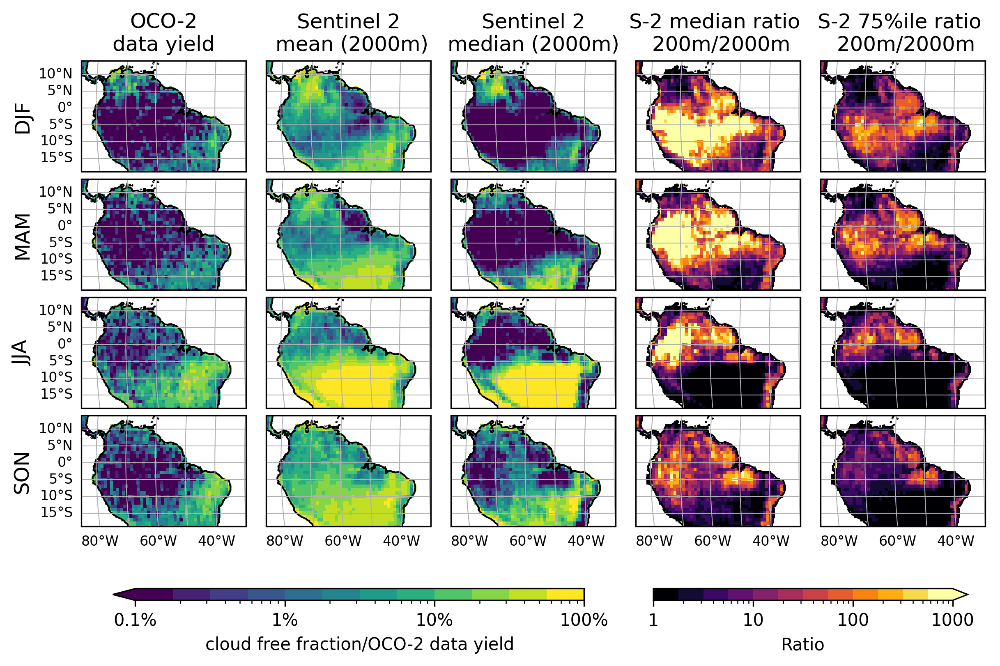

In [16]:
fig = plot_fig2()
fig.savefig(f"../figures/fig_02_vs_{d}_amazon_v4.png",dpi=300)
fig.savefig(f"../figures/fig_02_vs_{d}_amazon_v4.pdf",dpi=300)

### Figure 4 - time between valid measurements

Calculate dry periods and valid scenes

In [17]:
S2_valid = S2_df02[S2_df02['cloud_free_fraction02'] > 0.02].sort_values('time')

top3_dt = S2_valid.groupby(['lat','lon','res']).apply(lambda x: x['time'].sort_values().diff().dropna().dt.total_seconds().sort_values().tail(3).mean()/(3600*24)).to_xarray()
new_coords = {'x':np.arange(-180,180),'y':np.arange(-90,90)}
top3_dt = top3_dt.rename({'lat':'y','lon':'x'}).reindex(new_coords,fill_value=np.nan)
top3_dt.rio.write_crs("epsg:4326", inplace=True);
top3_dt = top3_dt.rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')

N_valid = S2_valid.groupby(['lat','lon','res']).size().to_xarray()
N_valid = N_valid.rename({'lat':'y','lon':'x'}).reindex(new_coords,fill_value=np.nan)
N_valid.rio.write_crs("epsg:4326", inplace=True);
N_valid = N_valid.rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')
N_valid_ratio = N_valid.sel(res=200)/N_valid.sel(res=2000)

plot

In [19]:
# from palettable.colorbrewer.sequential import BuGn_9
from matplotlib.colors import ListedColormap
from matplotlib import cm

def get_largest(df,res):
    a = (df[df>0.02])[res].dropna().reset_index()
    a2 = a['time'].diff()
    largest = a2.dt.total_seconds().sort_values().dropna().tail(3).min()
    inds = np.argwhere(a2.dt.total_seconds() >= largest).squeeze()
    starts = a.iloc[inds-1]
    ends = a.iloc[inds]
    return pd.concat([starts.reset_index()['time'],ends.reset_index()['time']],axis=1,keys=['start','end'])


def plot_fig4(coords=[-55,1],extent=[-85, -33, -18, 13],S2 = S2_df02,label='cloud_free_fraction02',hspace=-.3):
    cmap = plt.get_cmap('Reds', 12)
    cmap2 = plt.get_cmap('PuBu_r', 12)

    label='cloud_free_fraction02'
    S2_season_median02.sel(res=200)[label]/S2_season_median02.sel(res=2000)[label]
    ratio = S2_season_median02.sel(res=200, season='MAM')[label]/(S2_season_median02.sel(res=2000, season='MAM')[label]+1e-10)
    regions = [[coords[0]-.5, coords[0]+.5, coords[1]-0.5, coords[1]+.5],
            ]
    box_to_polygon = lambda box : Polygon([ [box[0],box[2]], [box[0],box[3]], [box[1],box[3]],[box[1],box[2]],  [box[0],box[2]] ])
    point = gpd.GeoDataFrame(geometry=[box_to_polygon(box) for box in regions], crs="epsg:4326")


    fig = plt.figure(dpi=300,figsize=(12,8))
    gs = gridspec.GridSpec(2, 3,height_ratios=[1,2])

    # fig a
    ax = plt.subplot(gs[0:3])
    ts = S2[(S2['lon']==coords[0]) & (S2['lat']==coords[1])].sort_values('time').dropna()
    ts_plot = ts[ts['res'].isin([200,2000])].groupby(['time','res'])[label].mean().unstack()
    ts_plot.columns = ['200m','2000m']
    ts_plot.plot(ax=ax,color=['C2','C3'],lw=1,alpha=0.5)
    ax.set(ylabel='cloud-free fraction',ylim=[-0.01,1],xlabel='')
    ax.yaxis.set_major_formatter(PercentFormatter(1,0))
    ax.axhline(0.02,c='grey',ls='--')
    ax.text(-0.18, 1.05, 'A', transform=ax.transAxes, fontsize=13, fontweight='bold', va='top')
    (ts_plot[ts_plot>0.02]).plot(ax=ax,color=['C2','C3'],lw=2,legend=False,marker='o',ms=3,ls='none')

    for lab,c,b,d in zip(['200m','2000m'],['C2','C3'],[0.8,0.9],[-0.02,-0.02]):
        lines = get_largest(ts_plot,lab)
        for i,l in lines.iterrows():
            pd.Series([b,b],index=l.values).plot(ax=ax,lw=1.5,color=c)
            pd.Series([b,b+d],index=[l['end'],l['end']]).plot(ax=ax,lw=1.5,color=c)
            pd.Series([b,b+d],index=[l['start'],l['start']]).plot(ax=ax,lw=1.5,color=c)

    #despline 
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_title(f'cloud-free fraction at {int(abs(coords[0]))}˚{"W" if coords[0]>0 else "E" } {int(abs(coords[1]))}˚{"N" if coords[1]>0 else "S" }',fontsize=10)
    ax.tick_params(rotation=0)

    for i,l in enumerate(['2000','200','ratio']):
        ax = plt.subplot(gs[1,i],projection=ccrs.Robinson())
        if l != 'ratio':
            plot_da = top3_dt.sel(res=float(l))
            if l == '2000':
                plot_da.plot(ax=ax,transform=ccrs.PlateCarree(),rasterized=True,cmap=cmap,cbar_kwargs={'pad':0.01,'orientation':'horizontal','label':'length of data-free periods (days)'},vmin=0,vmax=150)
            else:
                plot_da.plot(ax=ax,transform=ccrs.PlateCarree(),rasterized=True,cmap=cmap,cbar_kwargs={'pad':0.01,'orientation':'horizontal','label':'length of data-free periods (days)'},vmin=0,vmax=150)
            ax.set_title(f'{l}m footprint size')
        else:
            # plot_da = top3_dt.sel(res=2000)/top3_dt.sel(res=200)
            plot_da = N_valid_ratio
            plot_da.plot(ax=ax,transform=ccrs.PlateCarree(),rasterized=True,cmap=cmap2 ,cbar_kwargs={'pad':0.01,'orientation':'horizontal','label':'Number of valid scenes (200m/2000m)'}, vmin=1, vmax=5)
            ax.set_title(f'ratio of valid scenes')
        ax.set_extent(extent, crs=ccrs.PlateCarree())
        ax.coastlines(lw=1)
        ax.gridlines(draw_labels=False, dms=True, x_inline=False, y_inline=False)
        gpd.GeoDataFrame(geometry=point.iloc[0],crs="epsg:4326" ).plot(ax=ax,color='none',edgecolor='Indianred',lw=1,rasterized=True,transform=ccrs.PlateCarree(),zorder=10)

    plt.subplots_adjust(wspace=0.2,hspace=hspace)
    return fig

In [27]:
# from palettable.colorbrewer.sequential import BuGn_9
from matplotlib.colors import ListedColormap
from matplotlib import cm

def get_largest(df,res):
    a = (df[df>0.02])[res].dropna().reset_index()
    a2 = a['time'].diff()
    largest = a2.dt.total_seconds().sort_values().dropna().tail(3).min()
    inds = np.argwhere(a2.dt.total_seconds() >= largest).squeeze()
    starts = a.iloc[inds-1]
    ends = a.iloc[inds]
    return pd.concat([starts.reset_index()['time'],ends.reset_index()['time']],axis=1,keys=['start','end'])


def plot_fig4(coords=[-55,1],extent=[-85, -33, -18, 13],S2 = S2_df02,label='cloud_free_fraction02',hspace=-.3):
    cmap = plt.get_cmap('Reds', 15)
    cmap2 = plt.get_cmap('PuBu_r', 12)

    label='cloud_free_fraction02'
    S2_season_median02.sel(res=200)[label]/S2_season_median02.sel(res=2000)[label]
    ratio = S2_season_median02.sel(res=200, season='MAM')[label]/(S2_season_median02.sel(res=2000, season='MAM')[label]+1e-10)
    regions = [[coords[0]-.5, coords[0]+.5, coords[1]-0.5, coords[1]+.5],
            ]
    box_to_polygon = lambda box : Polygon([ [box[0],box[2]], [box[0],box[3]], [box[1],box[3]],[box[1],box[2]],  [box[0],box[2]] ])
    point = gpd.GeoDataFrame(geometry=[box_to_polygon(box) for box in regions], crs="epsg:4326")


    fig = plt.figure(dpi=300,figsize=(12,10.0))
    gs = gridspec.GridSpec(2, 2,height_ratios=[0.8,2])

    # fig a
    ax = plt.subplot(gs[0:2])
    ts = S2[(S2['lon']==coords[0]) & (S2['lat']==coords[1])].sort_values('time').dropna()
    ts_plot = ts[ts['res'].isin([200,2000])].groupby(['time','res'])[label].mean().unstack()
    ts_plot.columns = ['200m','2000m']
    ts_plot.plot(ax=ax,color=['C2','C3'],lw=1,alpha=0.5)
    ax.set(ylabel='cloud-free fraction',ylim=[-0.01,1],xlabel='')
    ax.yaxis.set_major_formatter(PercentFormatter(1,0))
    ax.axhline(0.02,c='grey',ls='--')
    ax.text(0., 1.1, "A", transform=ax.transAxes, fontsize=13, fontweight='bold', va='top')
    (ts_plot[ts_plot>0.02]).plot(ax=ax,color=['C2','C3'],lw=2,legend=False,marker='o',ms=3,ls='none')

    for lab,c,b,d in zip(['200m','2000m'],['C2','C3'],[0.8,0.9],[-0.02,-0.02]):
        lines = get_largest(ts_plot,lab)
        for i,l in lines.iterrows():
            pd.Series([b,b],index=l.values).plot(ax=ax,lw=1.5,color=c)
            pd.Series([b,b+d],index=[l['end'],l['end']]).plot(ax=ax,lw=1.5,color=c)
            pd.Series([b,b+d],index=[l['start'],l['start']]).plot(ax=ax,lw=1.5,color=c)

    #despline 
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_title(f'cloud-free fraction at {int(abs(coords[0]))}˚{"W" if coords[0]>0 else "E" } {int(abs(coords[1]))}˚{"N" if coords[1]>0 else "S" }',fontsize=10)
    ax.tick_params(rotation=0)
    captions = ['B','C']
    for i,l in enumerate(['2000','200']):
        ax = plt.subplot(gs[1,i],projection=ccrs.Robinson())
        ax.text(0., 1.1, captions[i], transform=ax.transAxes, fontsize=13, fontweight='bold', va='top')
        if l != 'ratio':
            plot_da = top3_dt.sel(res=float(l))
            if l == '2000':
                plot_da.plot(ax=ax,transform=ccrs.PlateCarree(),rasterized=True,cmap=cmap,cbar_kwargs={'pad':0.01,'orientation':'horizontal','label':'length of data-free periods (days)'},vmin=0,vmax=150)
            else:
                plot_da.plot(ax=ax,transform=ccrs.PlateCarree(),rasterized=True,cmap=cmap,cbar_kwargs={'pad':0.01,'orientation':'horizontal','label':'length of data-free periods (days)'},vmin=0,vmax=150)
            ax.set_title(f'{l}m footprint size')
        else:
            # plot_da = top3_dt.sel(res=2000)/top3_dt.sel(res=200)
            plot_da = N_valid_ratio
            plot_da.plot(ax=ax,transform=ccrs.PlateCarree(),rasterized=True,cmap=cmap2 ,cbar_kwargs={'pad':0.01,'orientation':'horizontal','label':'Number of valid scenes (200m/2000m)'}, vmin=1, vmax=5)
            ax.set_title(f'ratio of valid scenes')
        ax.set_extent(extent, crs=ccrs.PlateCarree())
        ax.coastlines(lw=1)
        ax.gridlines(draw_labels=False, dms=True, x_inline=False, y_inline=False)
        gpd.GeoDataFrame(geometry=point.iloc[0],crs="epsg:4326" ).plot(ax=ax,color='none',edgecolor='Blue',lw=1,rasterized=True,transform=ccrs.PlateCarree(),zorder=10)

    plt.subplots_adjust(wspace=0.2,hspace=hspace)
    return fig

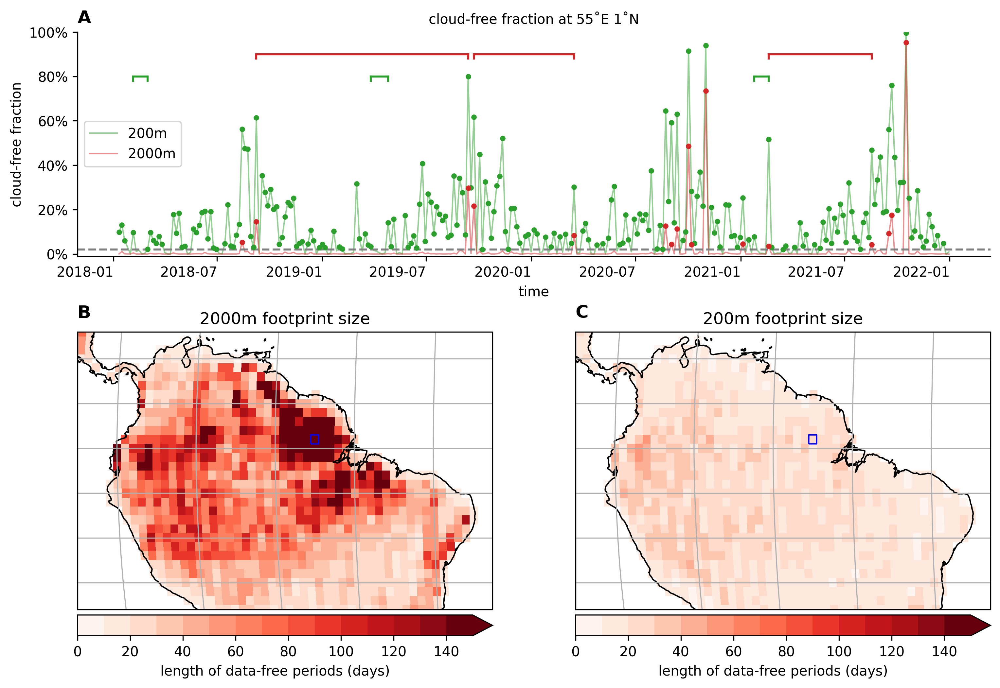

In [30]:

fig = plot_fig4()
d = datetime.today().strftime('%Y-%m-%d')
plt.savefig(f'../figures/fig_04_v2_{d}.png',dpi=300)
plt.savefig(f'../figures/fig_04_v2_{d}.pdf',dpi=300)

### Figure S2 - OCO-3 data

In [82]:
def plot_figS2(region):
    OCO3_L1B_hourly.rio.write_crs("epsg:4326", inplace=True)
    OCO3_L2_hourly.rio.write_crs("epsg:4326", inplace=True)
    OCO3_L2_hourly_raw.rio.write_crs("epsg:4326", inplace=True)
    OCO3_L1B_hourly_amazon = OCO3_L1B_hourly.where(OCO3_L1B_hourly>0).rio.clip(region.geometry.values, region.crs)
    OCO3_L2_hourly_amazon = OCO3_L2_hourly.where(OCO3_L2_hourly>0).rio.clip(region.geometry.values, region.crs)
    OCO3_L2_hourly_raw_amazon = OCO3_L2_hourly_raw.where(OCO3_L2_hourly_raw>0).rio.clip(region.geometry.values, region.crs)
    fig,ax = plt.subplots(dpi=300)
    (OCO3_L2_hourly_raw_amazon.sum(['x','y'])/OCO3_L1B_hourly_amazon.sum(dim=['x','y'])).drop('spatial_ref').fillna(0).plot(ax=ax,lw=2,color='k')
    (OCO3_L2_hourly_amazon.sum(['x','y'])/OCO3_L1B_hourly_amazon.sum(dim=['x','y'])).drop('spatial_ref').fillna(0).plot(ax=ax,lw=2,color='Indianred')
    ax.yaxis.set_major_formatter(PercentFormatter(1,0))

    ax.set(xlabel='Hour of day',ylabel='OCO-3 data yield',xlim=[5,20],ylim=[0,0.12])
    ax.axvline(10.5,color='grey')
    ax.axvline(13.5,color='grey')
    ax.text(10.6,0.1,'Sentinel-2',rotation=90,va='top')
    ax.text(13.6,0.1,'OCO-2',rotation=90,va='top')
    plt.legend(['before stringent quality filtering','after stringent quality filtering'],loc='upper left')
    return fig

In [65]:
# define regions of interest
region_names = ['amazon','congo','sea']
regions = [[-78, -52, -5, 2],
        [7, 25, -5, 2],
        [90, 160, -5, 2],
            ]

box_to_polygon = lambda box : Polygon([ [box[0],box[2]], [box[0],box[3]], [box[1],box[3]],[box[1],box[2]],  [box[0],box[2]] ])
regions_gdf = gpd.GeoDataFrame(geometry=[box_to_polygon(box) for box in regions], crs="epsg:4326")


/tmp/ipykernel_1993117/836976934.py:9: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  (OCO3_L2_hourly_raw_amazon.sum(['x','y'])/OCO3_L1B_hourly_amazon.sum(dim=['x','y'])).drop('spatial_ref').fillna(0).plot(ax=ax,lw=2,color='k')
/tmp/ipykernel_1993117/836976934.py:10: DeprecationWarning: dropping variables using `drop` is deprecated; use drop_vars.
  (OCO3_L2_hourly_amazon.sum(['x','y'])/OCO3_L1B_hourly_amazon.sum(dim=['x','y'])).drop('spatial_ref').fillna(0).plot(ax=ax,lw=2,color='Indianred')


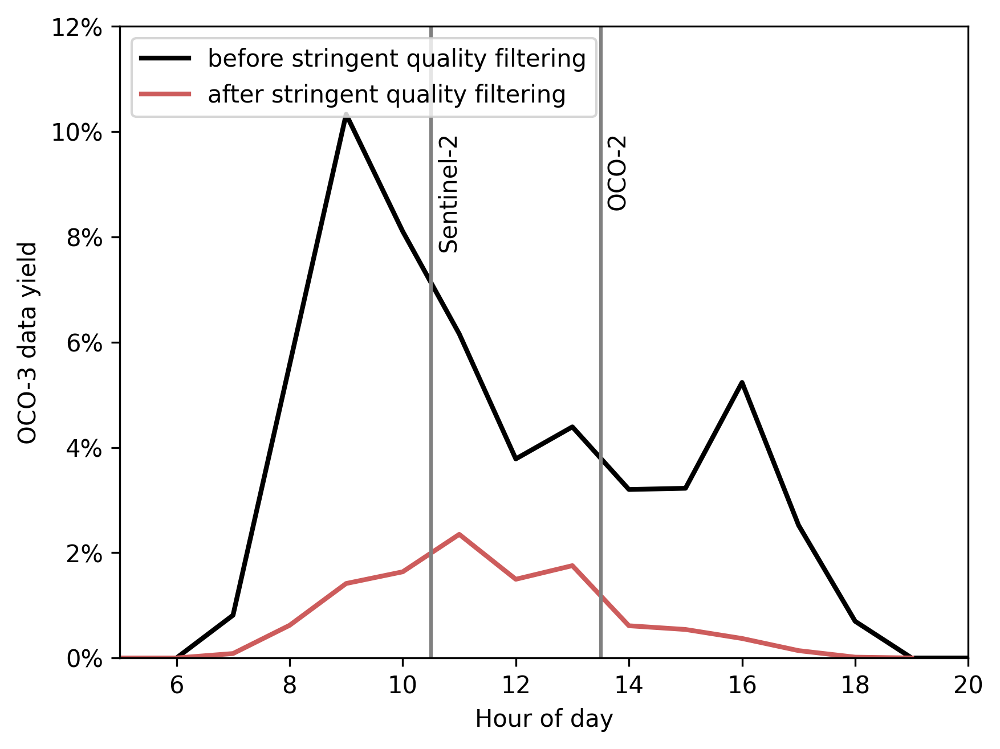

In [83]:
fig = plot_figS2(regions_gdf[:1])
d = datetime.today().strftime('%Y-%m-%d')
plt.savefig(f'figures/fig_s2_{d}.png',dpi=300,bbox_inches='tight')
plt.savefig(f'figures/fig_s2_{d}.pdf',dpi=300,bbox_inches='tight')

### Figure S3 - Spatial extent and revisit time for amazon

In [16]:
def plot_fig_S3(plot_df,S2_season_median):
    # calculate revisit time
    spatial_elements = 1000;
    swath = spatial_elements*plot_df[0.5].index
    revisit = 40075e3/(swath*15)

    # plot
    fig = plt.figure(dpi=300,figsize=(11,6),constrained_layout=True)
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 3])

    # fig a
    ax = plt.subplot(gs[0])
    plot_df[0.5].plot(ax=ax)
    ax.set(ylim=[0,0.6])
    ax.set_ylabel('cloud-free fraction',color='C00')
    ax.yaxis.set_major_formatter(PercentFormatter(1,0))
    ax2 = ax.twinx()

    eff_rev = revisit/plot_df[0.5]
    eff_rev = eff_rev/eff_rev.min()
    eff_rev[eff_rev>1e10] = 1e3

    ax2.plot(plot_df[0.5].index,eff_rev,c='C01',lw=2)
    ax2.set(ylim=[0,5])
    ax2.set_ylabel('relative revisit time (-)',color='C01')


    ax.fill_between(plot_df[0.5].index,plot_df[0.8],plot_df[0.2],alpha=0.5)

    ax.set(xlabel='footprint size (m)',xlim=[0,3000],xticks=[0,500,1000,1500,2000,2500,3000])
    ax.set_position([0.0, .2, .2, .3])     

    # map
    ax1 = plt.subplot(gs[1],projection=ccrs.Robinson())

    ds_plot_median = S2_season_median.median(dim='time')
    S2_ds_median_plot_da = ds_plot_median.reindex(new_coords,fill_value=np.nan).rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')
    spatial_elements = 1000;
    swath = spatial_elements*S2_ds_median_plot_da['res']
    revisit = 40075e3/(swath*15)
    # a = (revisit/S2_ds_median_plot_da).fillna(9999).argmin(dim='res')['cloud_free_fraction02']
    a = (revisit/S2_ds_median_plot_da).fillna(9999).argmin(dim='res')['cloud_free_fraction1']
    plot_da = xr.DataArray.from_series(a.to_series().replace({k:v for k,v in enumerate(S2_ds_median_plot_da['res'].values)}))
    plot_da.rio.write_crs("epsg:4326", inplace=True);
    # plot_da = plot_da.where(S2_ds_median_plot_da.sel(res=30)['cloud_free_fraction02'].notnull()).drop(['res','spatial_ref'])
    plot_da = plot_da.where(S2_ds_median_plot_da.sel(res=30)['cloud_free_fraction1'].notnull()).drop(['res','spatial_ref'])


    bounds = plot_df.index
    norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)
    cmap = plt.get_cmap('viridis', len(bounds)-1)
    m = plot_da.plot(ax=ax1,vmin=0,transform=ccrs.PlateCarree(),cbar_kwargs={'pad':0.1,'orientation':'horizontal','label':'optimal footprint size (m)','aspect':50},cmap=cmap)
    cbar = m.colorbar
    cbar.set_ticklabels([f'>{int(i)}' if i>=3000 else int(i) for i in cbar.get_ticks()] )
    
    
    
    ax1.coastlines(lw=1)
    ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,lw=0.5)
    ax1.set_extent([-120.9, 179.9, -25, 25], crs=ccrs.PlateCarree())
    return fig

/tmp/ipykernel_1106510/1114041504.py:54: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'>{int(i)}' if i>=3000 else int(i) for i in cbar.get_ticks()] )
/tmp/ipykernel_1106510/1825156046.py:16: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.savefig(f"../figures/fig_s3_{d}.png",dpi=300,bbox_inches='tight')
/tmp/ipykernel_1106510/1825156046.py:17: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.savefig(f"../figures/fig_s3_{d}.pdf",dpi=300,bbox_inches='tight')
/home/ymbaron/envs/SIF_GPP/lib64/python3.9/site-packages/IPython/core/events.py:82: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  func(*args, **kwargs)
/home/ymbaron/envs/SIF_GPP/lib64/python3.9/site-package

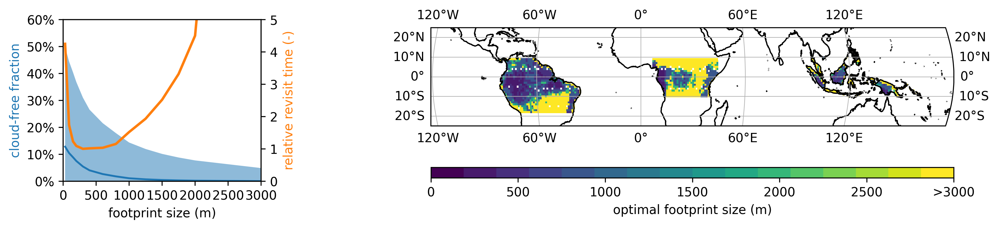

In [17]:
    # def plot_figS3():
#load data
box_df = pd.read_feather('/home/ymbaron/data/cloud_effect/GE_BOX2.feather')
plot_df = box_df.groupby('res')['cloud_free_fraction1'].quantile([0.2,0.5,0.8]).unstack()
plot_df = plot_df.drop(index=[60,120])

# calc median
S2_ds_median = S2_df.groupby(['lat','lon','time','res'])[['cloud_free_fraction1','cloud_free_fraction5']].median().to_xarray()
# S2_ds_median = S2_df02.groupby(['lat','lon','time','res'])['cloud_free_fraction02'].median().to_xarray()
S2_ds_median.rio.write_crs("epsg:4326", inplace=True)
S2_ds_median = S2_ds_median.rename({'lat':'y','lon':'x'})

fig = plot_fig_S3(plot_df,S2_ds_median)

d = datetime.today().strftime('%Y-%m-%d')
fig.savefig(f"../figures/fig_s3_{d}.png",dpi=300,bbox_inches='tight')
fig.savefig(f"../figures/fig_s3_{d}.pdf",dpi=300,bbox_inches='tight')

### Figure S4 - Figure 2 for Congo

/tmp/ipykernel_3629908/1041016195.py:54: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'{"" if i*100 %1 !=0 else ""}{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )
/tmp/ipykernel_3629908/1041016195.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar2.set_ticklabels([f'{"" if i==1000 else ""}{int(i*1000)}' for i in cbar.get_ticks()] )


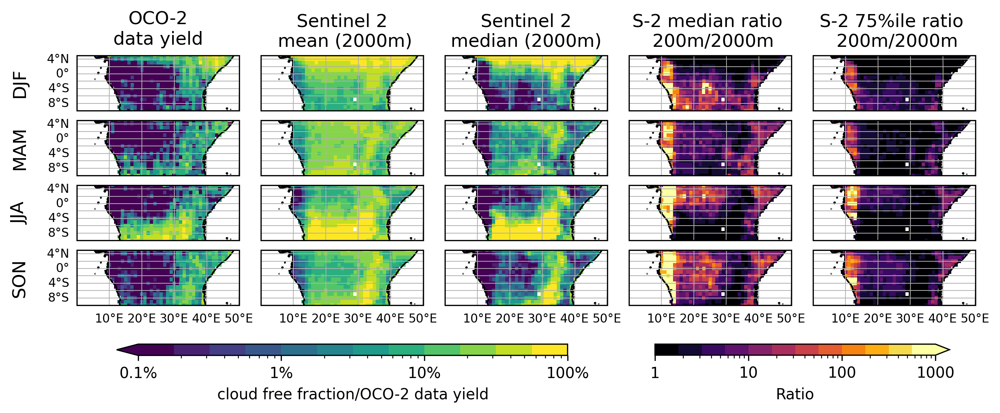

In [31]:
# ,hspace=0.15,wspace=0.16
fig = plot_fig2(extent=[0, 50, -10, 5],mean=S2_season_mean02,median=S2_season_median02,label='cloud_free_fraction1',hspace=0.17,wspace=0.1,h=0.15,w=0.15)
# fig = plot_fig2(extent=[0, 50, -10, 5],mean=S2_season_mean,median=S2_season_median,label='cloud_free_fraction1',hspace=0.21,wspace=0.1)
d = datetime.today().strftime('%Y-%m-%d')
fig.savefig(f"../figures/fig_s4_{d}.png",dpi=300)
fig.savefig(f"../figures/fig_s4_{d}.pdf",dpi=300)

### Figure S5 - Figure 2 for Indonesia

/tmp/ipykernel_3629908/1041016195.py:54: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'{"" if i*100 %1 !=0 else ""}{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )
/tmp/ipykernel_3629908/1041016195.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar2.set_ticklabels([f'{"" if i==1000 else ""}{int(i*1000)}' for i in cbar.get_ticks()] )


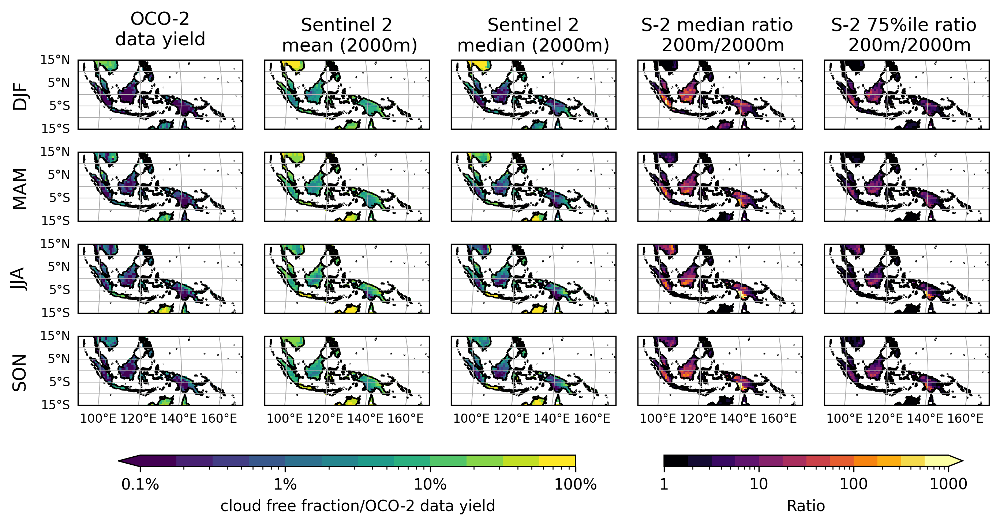

In [32]:
fig = plot_fig2(extent=[90, 170, -15, 15],mean=S2_season_mean02,median=S2_season_median02,label='cloud_free_fraction1',hspace=0.17,wspace=0.14,h=0.15,w=0.15)
# fig = plot_fig2(extent=[90, 170, -15, 15],mean=S2_season_mean,median=S2_season_median,label='cloud_free_fraction1',hspace=0.21,wspace=0.14)
d = datetime.today().strftime('%Y-%m-%d')
fig.savefig(f"../figures/fig_s5_{d}.png",dpi=300)
fig.savefig(f"../figures/fig_s5_{d}.pdf",dpi=300)

### Figure S6 - old - Figure 4 for Congo

Calculate dry periods and valid scenes - temp until we get 0.2% globally

In [ ]:
S2_valid = S2_df[S2_df['cloud_free_fraction1'] > 0.02].sort_values('time')

top3_dt = S2_valid.groupby(['lat','lon','res']).apply(lambda x: x['time'].sort_values().diff().dropna().dt.total_seconds().sort_values().tail(3).mean()/(3600*24)).to_xarray()
new_coords = {'x':np.arange(-180,180),'y':np.arange(-90,90)}
top3_dt = top3_dt.rename({'lat':'y','lon':'x'}).reindex(new_coords,fill_value=np.nan)
top3_dt.rio.write_crs("epsg:4326", inplace=True);
top3_dt = top3_dt.rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')

N_valid = S2_valid.groupby(['lat','lon','res']).size().to_xarray()
N_valid = N_valid.rename({'lat':'y','lon':'x'}).reindex(new_coords,fill_value=np.nan)
N_valid.rio.write_crs("epsg:4326", inplace=True);
N_valid = N_valid.rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')
N_valid_ratio = N_valid.sel(res=200)/N_valid.sel(res=2000)

plot

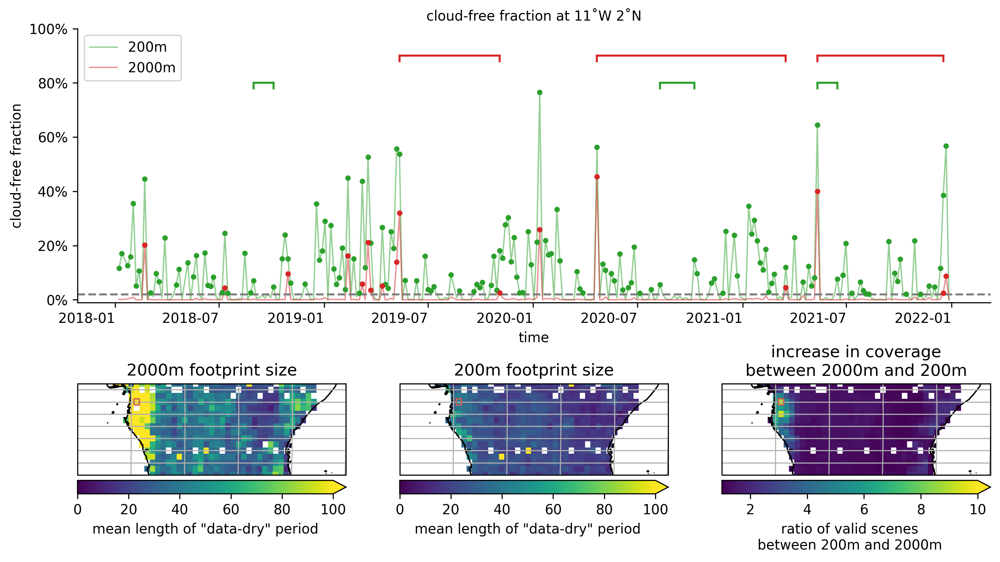

In [ ]:
fig = plot_fig4(coords=[11,2],extent=[0, 50, -10, 5],S2=S2_df,label='cloud_free_fraction1',hspace=-.7)
d = datetime.today().strftime('%Y-%m-%d')
plt.savefig(f'../figures/fig_s6_{d}.png',dpi=300)
plt.savefig(f'../figures/fig_s6_{d}.pdf',dpi=300)

### Figure S6 - Figure 2 for whole world

/tmp/ipykernel_3629908/1041016195.py:54: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'{"" if i*100 %1 !=0 else ""}{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )
/tmp/ipykernel_3629908/1041016195.py:58: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar2.set_ticklabels([f'{"" if i==1000 else ""}{int(i*1000)}' for i in cbar.get_ticks()] )


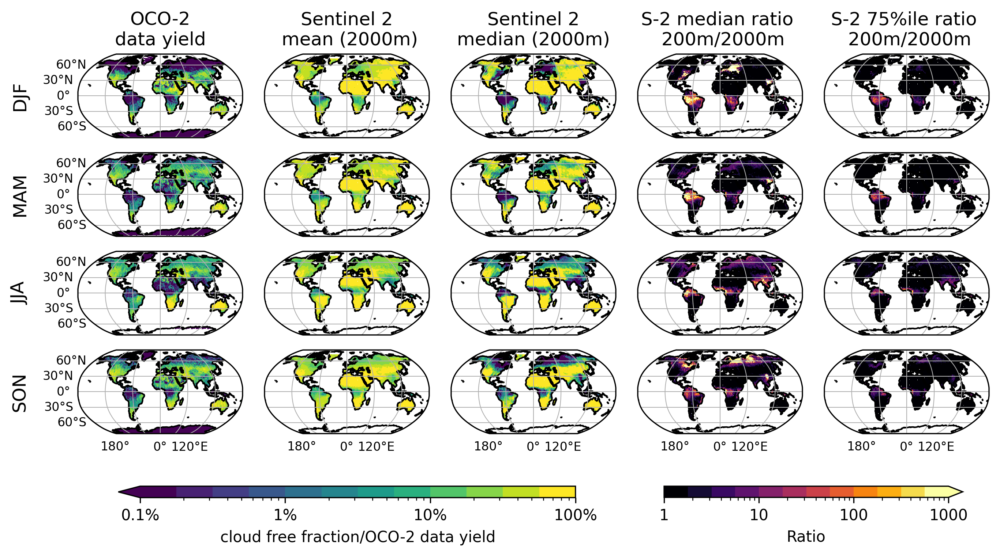

In [33]:
fig = plot_fig2(extent=[-180.5, 180.5, -90, 90],mean=S2_season_mean02,median=S2_season_median02,label='cloud_free_fraction1',hspace=0.17,wspace=0.15,h=0.15,w=0.15)
d = datetime.today().strftime('%Y-%m-%d')
fig.savefig(f"../figures/fig_s6_{d}.png",dpi=300)
fig.savefig(f"../figures/fig_s6_{d}.pdf",dpi=300)

### Figure S7 - Figure 4 for Indonesia

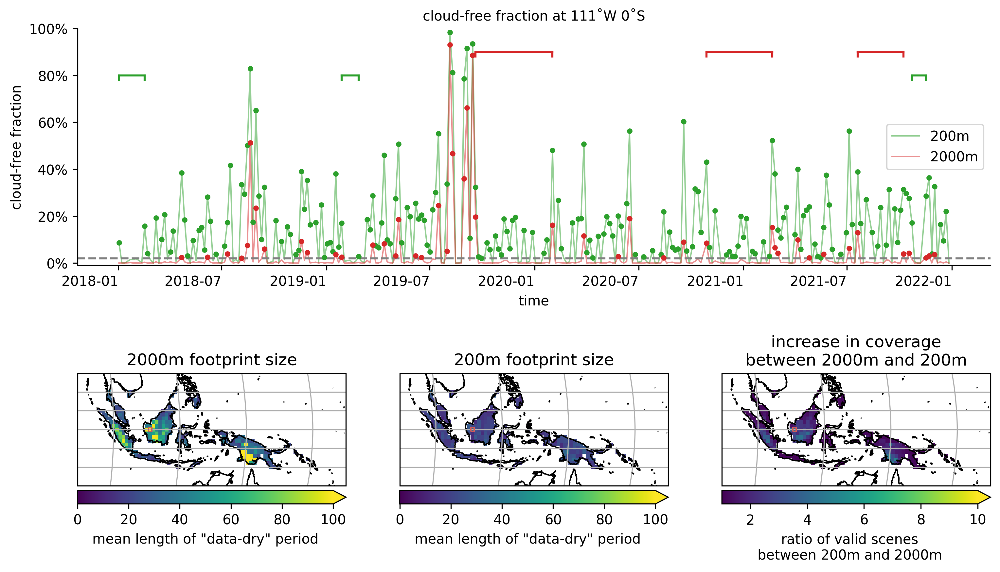

In [ ]:
fig = plot_fig4(coords=[111,0],extent=[90, 170, -15, 15],S2=S2_df,label='cloud_free_fraction1',hspace=-.5)
d = datetime.today().strftime('%Y-%m-%d')
plt.savefig(f'../figures/fig_s7_{d}.png',dpi=300)
plt.savefig(f'../figures/fig_s7_{d}.pdf',dpi=300)

### Figure S8 - Sensitivity analysis to different cutoffs

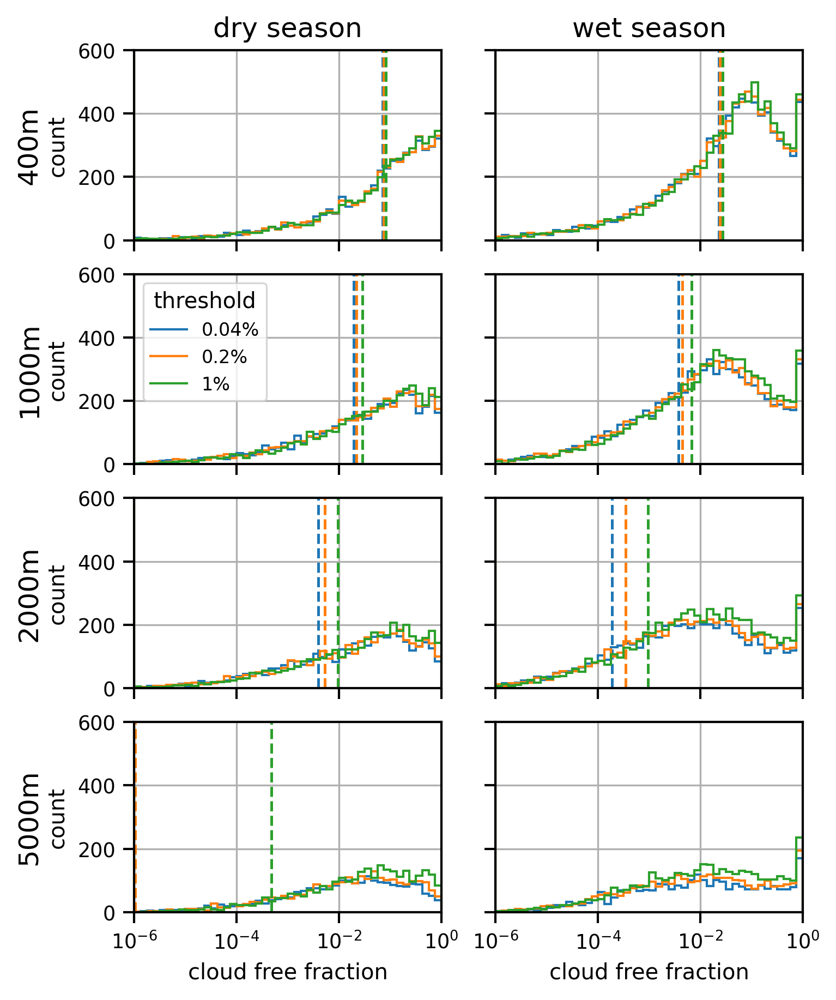

In [75]:
from matplotlib.lines import Line2D

cols = S2_df_final.columns[S2_df_final.columns.str.startswith('cloud_free_fraction')]
plot_df = S2_df_final[list(cols)+['system:index','res','dry_wet']]
plot_df.columns = ['0%','0.04%','0.2%','1%','ID','resolution','season']
plot_df = plot_df.loc[plot_df['season'] != 'nan',['0.04%','0.2%','1%','ID','resolution','season']]
plot_df.set_index('ID',inplace=True)



reses = [400,1000,2000,5000]
seasons = ['dry','wet']
threshs = ['0.04%','0.2%','1%']
# threshs = ['0%','0.04%','0.2%','1%']
cs = ['C0','C1','C2','C3']
medians = plot_df.groupby(['resolution','season']).median()
h=600
fig,ax = plt.subplots(4,2,dpi=300,constrained_layout=True,figsize=(5,6),sharex=True,sharey=True)
for i,res in enumerate(reses):
    for j, seas in enumerate(seasons):
        if i == 0:
            ax[i,j].set_title(seas + " season",fontsize=12)
        if j == 0:
            ax[i,j].set_ylabel('count')
            ax[i,j].text(5e-9,h/2,f'{res}m',rotation=90,va='center',fontsize=12)
        for z,t in enumerate(threshs):
            ax[i,j].hist(plot_df[(plot_df['resolution']==res) & (plot_df['season']==seas)][t],bins=[0] + list(np.logspace(-6,0,49)),histtype='step',edgecolor=cs[z],lw=1)
            ax[i,j].set_xscale('log')
            ax[i,j].set(xlim = [1e-6,1],ylim=[0,h])
            ax[i,j].axvline(medians.loc[res,seas][t],color=cs[z],ls='--',label='none')
        if (i == 1) & (j==0):
            custom_lines = [Line2D([0], [0], color=cs[0], lw=1),
                Line2D([0], [0], color=cs[1], lw=1),
                Line2D([0], [0], color=cs[2], lw=1),
                Line2D([0], [0], color=cs[3], lw=1)]
            ax[i,j].legend(custom_lines,threshs,loc='upper left',title='threshold',fontsize=8)
        if i == 3:
            ax[i,j].set_xlabel('cloud free fraction')
        ax[i,j].grid()

d = datetime.today().strftime('%Y-%m-%d')
plt.savefig(f'../figures/fig_s8_{d}.png',dpi=300)
plt.savefig(f'../figures/fig_s8_{d}.pdf',dpi=300)

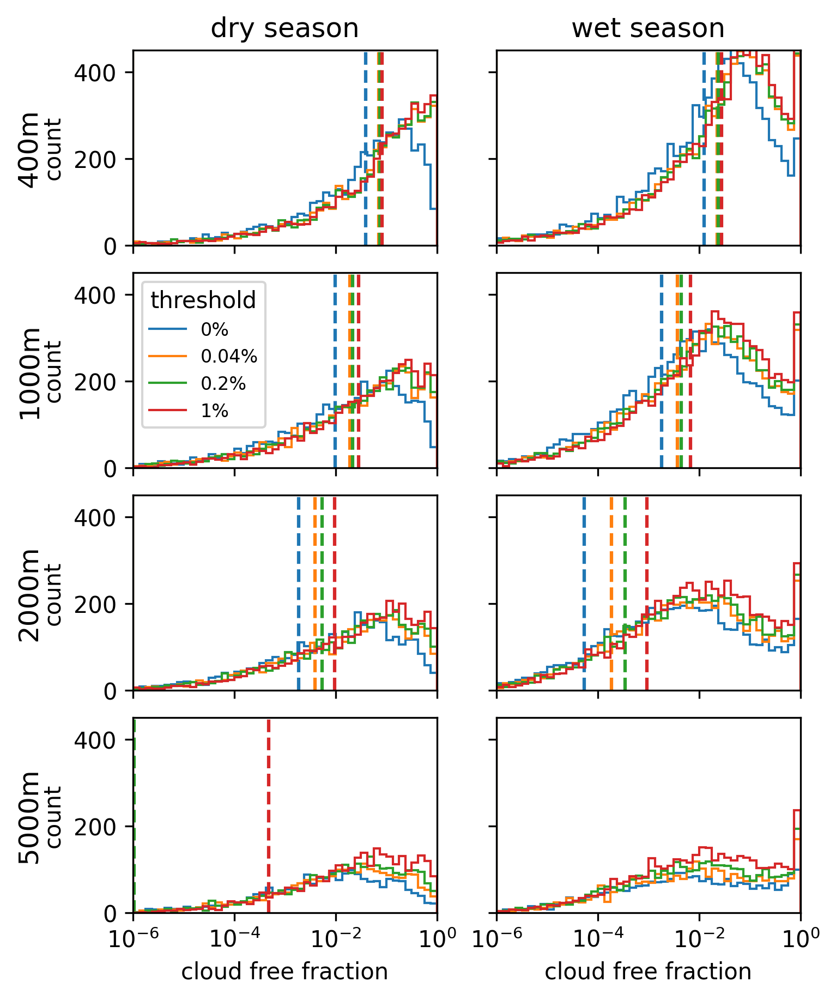

In [ ]:


cols = S2_df_final.columns[S2_df_final.columns.str.startswith('cloud_free_fraction')]
l = S2_df_final.loc[(S2_df_final['region'] != 'AmazonBoxToughThreshold2018-01-01'), list(cols)+['system:index','res','dry_wet']]
l2 = l.set_index(['system:index','res','dry_wet']).stack().reset_index().set_index('system:index')
l2 = l2.groupby(['system:index','res','dry_wet','level_3']).first().reset_index().set_index('system:index')#
# l2.drop_duplicates()
l2 = l2[l2['res'].isin([400,1000,2000,5000])]
l2 = l2.replace({'cloud_free_fraction1':'1%','cloud_free_fraction02':'0.2%','cloud_free_fraction000':'0%','cloud_free_fraction004':'0.04%'})

l2.columns = ['resolution','season','threshold','cloud free fraction']
l2['resolution'] = l2['resolution'].astype(int)
l2 = l2.sort_values(by='threshold')
l2 = l2[(l2['threshold']!='0%') & l2.season.isin(['wet','dry'])]
sns.set_context('paper')
# sns.set_style("ticks",{'axes.grid' : True})
reses = [400,1000,2000,5000]
seasons = ['dry','wet']
threshs = ['0.04%','0.2%','1%']
cs = ['C0','C1','C2']
medians = l2.groupby(['resolution','season','threshold'])['cloud free fraction'].median().unstack()
fig,ax = plt.subplots(4,2,dpi=300,constrained_layout=True,figsize=(5,6),sharex=True,sharey=True)
for i,res in enumerate(reses):
    for j, seas in enumerate(seasons):
        if i == 0:
            ax[i,j].set_title(seas + " season",fontsize=12)
        if j == 0:
            ax[i,j].set_ylabel('count')
            ax[i,j].text(5e-9,225,f'{res}m',rotation=90,va='center',fontsize=12)
        for z,t in enumerate(threshs):
            ax[i,j].hist(l2[(l2['resolution']==res) & (l2['season']==seas) & (l2['threshold']==t)]['cloud free fraction'],bins=[0] + list(np.logspace(-6,0,49)),histtype='step',edgecolor=cs[z],lw=1)
            ax[i,j].set_xscale('log')
            ax[i,j].set(xlim = [1e-6,1],ylim=[0,450])
            ax[i,j].axvline(medians.loc[res,seas][t],color=cs[z],ls='--',label='none')
        if (i == 1) & (j==0):
            custom_lines = [Line2D([0], [0], color=cs[0], lw=1),
                Line2D([0], [0], color=cs[1], lw=1),
                Line2D([0], [0], color=cs[2], lw=1)]
            ax[i,j].legend(custom_lines,threshs,loc='upper left',title='threshold',fontsize=8)
        if i == 3:
            ax[i,j].set_xlabel('cloud free fraction')

d = datetime.today().strftime('%Y-%m-%d')
plt.savefig(f'../figures/fig_s8_{d}.png',dpi=300)
plt.savefig(f'../figures/fig_s8_{d}.pdf',dpi=300)

In [43]:
cols = S2_df_final.columns[S2_df_final.columns.str.startswith('cloud_free_fraction')]
plot_df = S2_df_final[list(cols)+['system:index','res','dry_wet']]
l2 = l.set_index(['system:index','res','dry_wet']).stack().reset_index().set_index('system:index')
l2 = l2.groupby(['system:index','res','dry_wet','level_3']).first().reset_index().set_index('system:index')#
# l2.drop_duplicates()
l2 = l2[l2['res'].isin([400,1000,2000,5000])]
l2 = l2.replace({'cloud_free_fraction1':'1%','cloud_free_fraction02':'0.2%','cloud_free_fraction000':'0%','cloud_free_fraction004':'0.04%'})

l2.columns = ['resolution','season','threshold','cloud free fraction']
l2['resolution'] = l2['resolution'].astype(int)
l2 = l2.sort_values(by='threshold')
l2 = l2[(l2['threshold']!='0%') & l2.season.isin(['wet','dry'])]
# sns.set_context('talk')
# sns.set_style("ticks",{'axes.grid' : True})

g = sns.displot(kind='hist',data=l2,col='season',row='resolution',x='cloud free fraction',hue='threshold',bins=50,log_scale=(True,False),fill=False,element='step')

medians = l2.groupby(['resolution','season','threshold'])['cloud free fraction'].median().unstack()
g.set(xlim=[1e-6,1])
for ax in g.axes.flat:
    ks = [x.split(' = ')[1] for x in ax.title.get_text().split(' | ')]
    meds = medians.loc[(int(ks[0]),ks[1])]
    for m,c in zip(meds,['C0','C1','C2']):
        ax.axvline(m,c=c,ls='--')
    ax.grid(axis='y')    

d = datetime.today().strftime('%Y-%m-%d')
plt.tight_layout(pad=4)
plt.savefig(f'../figures/fig_s8_{d}.png',dpi=300)
plt.savefig(f'../figures/fig_s8_{d}.pdf',dpi=300)

,cloud_free_fraction000,cloud_free_fraction004,cloud_free_fraction02,cloud_free_fraction1,system:index,res,dry_wet
0,0.001087,0.001540,0.001967,0.003688,20180101T142751_20180101T142746_T20MPD,2000.0,wet
1,0.988024,0.991406,0.994572,0.998104,20180106T142849_20180106T142845_T20MPD,2000.0,wet
2,0.001150,0.001697,0.003082,0.005758,20180116T142849_20180116T142846_T20MPD,2000.0,wet
3,0.012768,0.033384,0.041470,0.065029,20180121T142751_20180121T142938_T20MPD,2000.0,wet
4,0.000000,0.000000,0.000000,0.000000,20180126T142849_20180126T142847_T20MPD,2000.0,wet
...,...,...,...,...,...,...,...
364,0.032162,0.059193,0.067160,0.087755,20211213T150721_20211213T150720_T19NDB,2000.0,wet
365,0.000000,0.000000,0.000000,0.000103,20211218T150719_20211218T150942_T19NDB,2000.0,wet
366,0.002373,0.003579,0.006263,0.014343,20211223T150721_20211223T150721_T19NDB,2000.0,wet
367,0.751743,0.837759,0.854241,0.882997,20211228T150719_20211228T150943_T19NDB,2000.0,wet


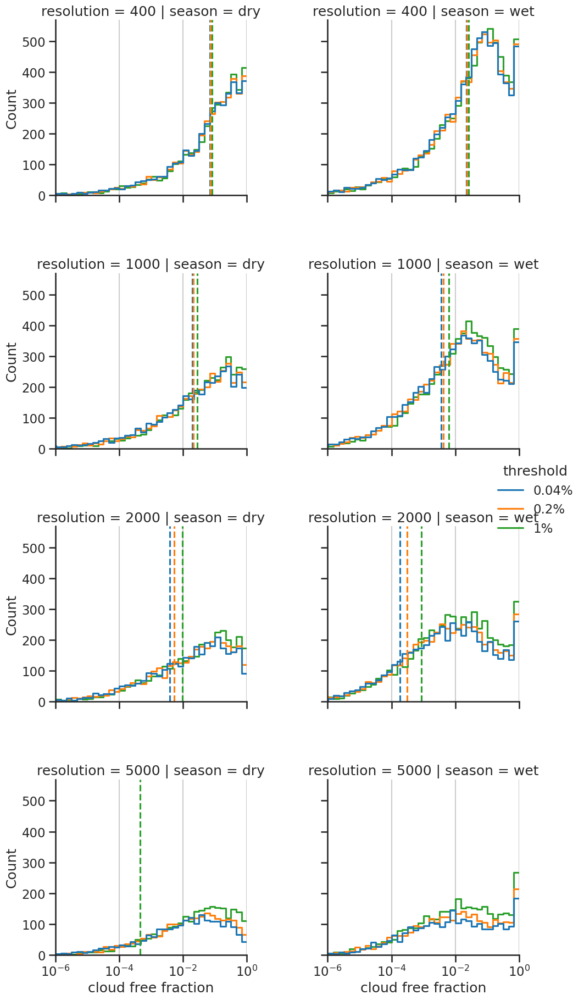

In [84]:
cols = S2_df_final.columns[S2_df_final.columns.str.startswith('cloud_free_fraction')]
l = S2_df_final.loc[(S2_df_final['region'] != 'AmazonBoxToughThreshold2018-01-01'), list(cols)+['system:index','res','dry_wet']]
l2 = l.set_index(['system:index','res','dry_wet']).stack().reset_index().set_index('system:index')
l2 = l2.groupby(['system:index','res','dry_wet','level_3']).first().reset_index().set_index('system:index')#
# l2.drop_duplicates()
l2 = l2[l2['res'].isin([400,1000,2000,5000])]
l2 = l2.replace({'cloud_free_fraction1':'1%','cloud_free_fraction02':'0.2%','cloud_free_fraction000':'0%','cloud_free_fraction004':'0.04%'})

l2.columns = ['resolution','season','threshold','cloud free fraction']
l2['resolution'] = l2['resolution'].astype(int)
l2 = l2.sort_values(by='threshold')
l2 = l2[(l2['threshold']!='0%') & l2.season.isin(['wet','dry'])]
# sns.set_context('talk')
# sns.set_style("ticks",{'axes.grid' : True})

g = sns.displot(kind='hist',data=l2,col='season',row='resolution',x='cloud free fraction',hue='threshold',bins=50,log_scale=(True,False),fill=False,element='step')

medians = l2.groupby(['resolution','season','threshold'])['cloud free fraction'].median().unstack()
g.set(xlim=[1e-6,1])
for ax in g.axes.flat:
    ks = [x.split(' = ')[1] for x in ax.title.get_text().split(' | ')]
    meds = medians.loc[(int(ks[0]),ks[1])]
    for m,c in zip(meds,['C0','C1','C2']):
        ax.axvline(m,c=c,ls='--')
    ax.grid(axis='y')    

d = datetime.today().strftime('%Y-%m-%d')
plt.tight_layout(pad=4)
plt.savefig(f'../figures/fig_s8_{d}.png',dpi=300)
plt.savefig(f'../figures/fig_s8_{d}.pdf',dpi=300)

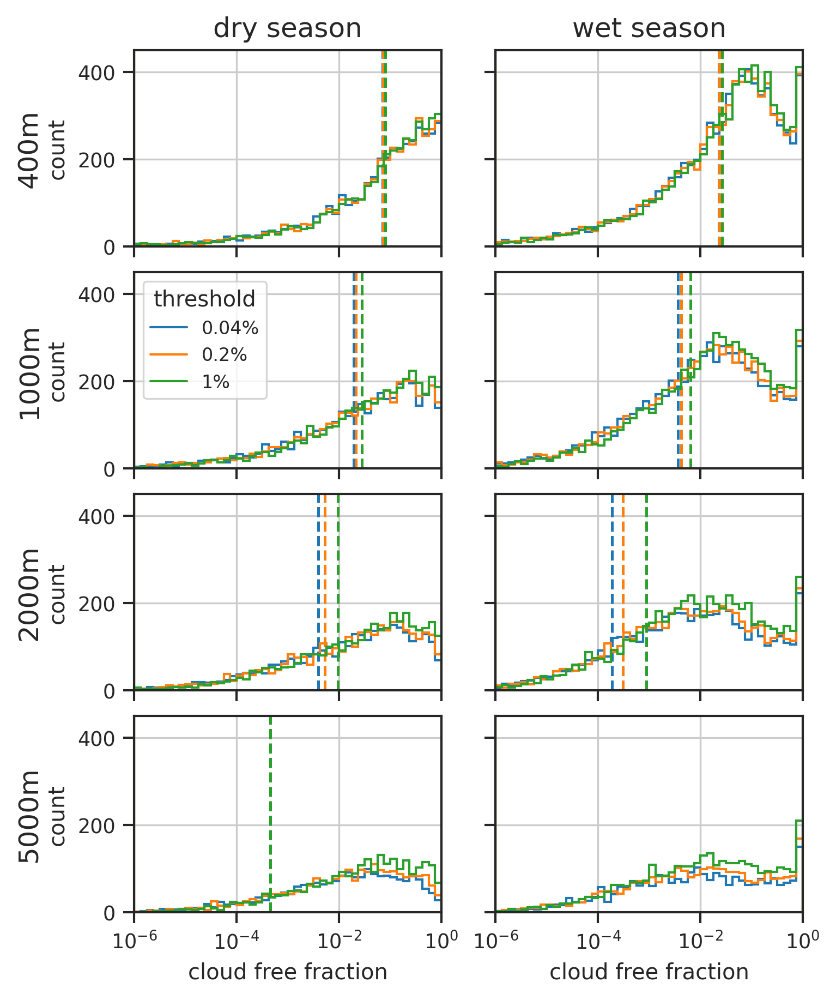

In [159]:
from matplotlib.lines import Line2D


cols = S2_df_final.columns[S2_df_final.columns.str.startswith('cloud_free_fraction')]
l = S2_df_final.loc[(S2_df_final['region'] != 'AmazonBoxToughThreshold2018-01-01'), list(cols)+['system:index','res','dry_wet']]
l2 = l.set_index(['system:index','res','dry_wet']).stack().reset_index().set_index('system:index')
l2 = l2.groupby(['system:index','res','dry_wet','level_3']).first().reset_index().set_index('system:index')#
# l2.drop_duplicates()
l2 = l2[l2['res'].isin([400,1000,2000,5000])]
l2 = l2.replace({'cloud_free_fraction1':'1%','cloud_free_fraction02':'0.2%','cloud_free_fraction000':'0%','cloud_free_fraction004':'0.04%'})

l2.columns = ['resolution','season','threshold','cloud free fraction']
l2['resolution'] = l2['resolution'].astype(int)
l2 = l2.sort_values(by='threshold')
l2 = l2[(l2['threshold']!='0%') & l2.season.isin(['wet','dry'])]
sns.set_context('paper')
# sns.set_style("ticks",{'axes.grid' : True})
reses = [400,1000,2000,5000]
seasons = ['dry','wet']
threshs = ['0.04%','0.2%','1%']
cs = ['C0','C1','C2']
medians = l2.groupby(['resolution','season','threshold'])['cloud free fraction'].median().unstack()
fig,ax = plt.subplots(4,2,dpi=300,constrained_layout=True,figsize=(5,6),sharex=True,sharey=True)
for i,res in enumerate(reses):
    for j, seas in enumerate(seasons):
        if i == 0:
            ax[i,j].set_title(seas + " season",fontsize=12)
        if j == 0:
            ax[i,j].set_ylabel('count')
            ax[i,j].text(5e-9,225,f'{res}m',rotation=90,va='center',fontsize=12)
        for z,t in enumerate(threshs):
            ax[i,j].hist(l2[(l2['resolution']==res) & (l2['season']==seas) & (l2['threshold']==t)]['cloud free fraction'],bins=[0] + list(np.logspace(-6,0,49)),histtype='step',edgecolor=cs[z],lw=1)
            ax[i,j].set_xscale('log')
            ax[i,j].set(xlim = [1e-6,1],ylim=[0,450])
            ax[i,j].axvline(medians.loc[res,seas][t],color=cs[z],ls='--',label='none')
        if (i == 1) & (j==0):
            custom_lines = [Line2D([0], [0], color=cs[0], lw=1),
                Line2D([0], [0], color=cs[1], lw=1),
                Line2D([0], [0], color=cs[2], lw=1)]
            ax[i,j].legend(custom_lines,threshs,loc='upper left',title='threshold',fontsize=8)
        if i == 3:
            ax[i,j].set_xlabel('cloud free fraction')

d = datetime.today().strftime('%Y-%m-%d')
plt.savefig(f'../figures/fig_s8_{d}.png',dpi=300)
plt.savefig(f'../figures/fig_s8_{d}.pdf',dpi=300)

,resolution,season,threshold,cloud free fraction
system:index,,,,
20190914T144729_20190914T144731_T19MHU,5000,dry,0.04%,0.002623
20200710T144729_20200710T144727_T20NLF,5000,dry,0.04%,0.000000
20200713T145729_20200713T145727_T19MEV,5000,dry,0.04%,0.000000
20190919T144731_20190919T144731_T20NLG,5000,dry,0.04%,0.001971
20190714T145731_20190714T150216_T19NGA,5000,dry,0.04%,0.000000
...,...,...,...,...
20190929T144731_20190929T144732_T19NHB,5000,dry,1%,0.003644
20190929T144731_20190929T144732_T19NHA,5000,dry,1%,0.334813
20190929T144731_20190929T144732_T19NGB,5000,dry,1%,0.004809


<Axes: ylabel='Frequency'>

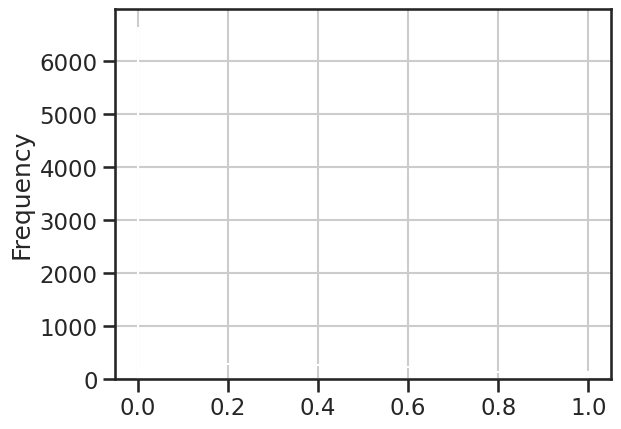

In [92]:
(l2[(l2['resolution']==res) & (l2['season']==seas)]['cloud free fraction']).plot.hist(bins=[0] + list(np.logspace(-6,0,49)),fill=False,)

In [47]:
(S2_df_final['cloud_free_fraction02'] == 0).sum()

84512

In [41]:
l2['low'] = l2['cloud free fraction'] < 0.001 
low = l2.groupby(['resolution','season','threshold'])['low'].sum()/ l2.groupby(['resolution','season','threshold'])['cloud free fraction'].count()
low.unstack()

threshold             0.04%      0.2%        1%
resolution season                              
400        dry     0.096867  0.095650  0.088918
           wet     0.128939  0.126762  0.119322
1000       dry     0.142720  0.132951  0.114711
           wet     0.213088  0.202525  0.179752
2000       dry     0.179509  0.165255  0.146509
           wet     0.288301  0.275004  0.237625
5000       dry     0.185327  0.173794  0.136928
           wet     0.261479  0.254066  0.218986

In [17]:
medians = l2.groupby(['resolution','season','threshold'])['cloud free fraction']a.median().unstack()
medians

threshold             0.04%      0.2%        1%
resolution season                              
400        dry     0.103251  0.106586  0.114965
           wet     0.044605  0.046242  0.051388
1000       dry     0.045962  0.049600  0.060655
           wet     0.014262  0.015563  0.020270
2000       dry     0.026812  0.031419  0.041889
           wet     0.006902  0.007705  0.010107
5000       dry     0.017131  0.021838  0.034443
           wet     0.009387  0.010620  0.013232

In [65]:
l[l['cloud_free_fraction02'] == 0]#.set_index(['system:index','res','dry_wet']).stack()

,cloud_free_fraction02,cloud_free_fraction1,cloud_free_fraction000,cloud_free_fraction004,system:index,res,dry_wet
0,0.0,0.00000,NaN,NaN,20180101T142751_20180101T142746_T20MQD,5000.0,wet
1,0.0,0.00000,NaN,NaN,20180101T142751_20180101T142746_T20MRD,5000.0,wet
4,0.0,0.00005,NaN,NaN,20180116T142849_20180116T142846_T20MQD,5000.0,wet
6,0.0,0.00000,NaN,NaN,20180121T142751_20180121T142938_T20MQD,5000.0,wet
7,0.0,0.00000,NaN,NaN,20180121T142751_20180121T142938_T20MRD,5000.0,wet
...,...,...,...,...,...,...,...
556,0.0,0.00000,NaN,NaN,20211123T150721_20211123T150720_T19MDU,1250.0,nan
557,0.0,0.00000,NaN,NaN,20211125T145719_20211125T145721_T19MDU,1250.0,nan
559,0.0,0.00000,NaN,NaN,20211130T145731_20211130T145725_T19MDU,1250.0,nan
562,0.0,0.00000,NaN,NaN,20211208T150719_20211208T150936_T19MDU,1250.0,wet


In [72]:
l.set_index(['system:index','res','dry_wet']).stack().reset_index()

,system:index,res,dry_wet,level_3,0
0,20180101T142751_20180101T142746_T20MQD,5000.0,wet,cloud_free_fraction02,0.000000
1,20180101T142751_20180101T142746_T20MQD,5000.0,wet,cloud_free_fraction1,0.000000
2,20180101T142751_20180101T142746_T20MRD,5000.0,wet,cloud_free_fraction02,0.000000
3,20180101T142751_20180101T142746_T20MRD,5000.0,wet,cloud_free_fraction1,0.000000
4,20180106T142849_20180106T142845_T20MQD,5000.0,wet,cloud_free_fraction02,0.890099
...,...,...,...,...,...
801635,20211223T150721_20211223T150721_T19NDB,2000.0,wet,cloud_free_fraction004,0.003579
801636,20211228T150719_20211228T150943_T19NDB,2000.0,wet,cloud_free_fraction000,0.751743
801637,20211228T150719_20211228T150943_T19NDB,2000.0,wet,cloud_free_fraction004,0.837759
801638,20211230T145731_20211230T145727_T19NDB,2000.0,wet,cloud_free_fraction000,0.000000


In [81]:
o = l.set_index(['system:index','res','dry_wet']).stack().reset_index().set_index('system:index')#
o = o.groupby(['system:index','res','dry_wet','level_3']).first().reset_index().set_index('system:index')#
o2 = o[(o['level_3'] == 'cloud_free_fraction02') & (o[0]==0)]
o2
# o

,res,dry_wet,level_3,0
system:index,,,,
20180101T142751_20180101T142746_T20MND,5000.0,wet,cloud_free_fraction02,0.0
20180101T142751_20180101T142746_T20MND,7500.0,wet,cloud_free_fraction02,0.0
20180101T142751_20180101T142746_T20MPD,5000.0,wet,cloud_free_fraction02,0.0
20180101T142751_20180101T142746_T20MPD,7500.0,wet,cloud_free_fraction02,0.0
20180101T142751_20180101T142746_T20MPE,7500.0,wet,cloud_free_fraction02,0.0
...,...,...,...,...
20211231T142731_20211231T142732_T20NRF,7500.0,wet,cloud_free_fraction02,0.0
20211231T142731_20211231T142732_T20NRG,2000.0,wet,cloud_free_fraction02,0.0
20211231T142731_20211231T142732_T20NRG,3000.0,wet,cloud_free_fraction02,0.0


Extra

Text(0.5, 1.0, 'all valid data from OCO-2 between 2018-2022')

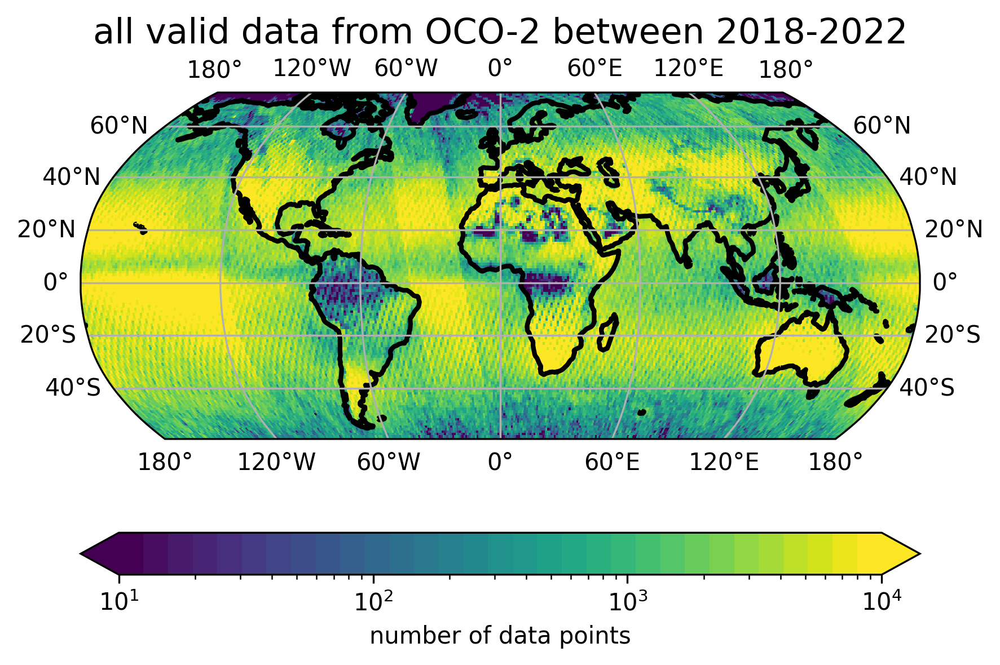

In [30]:
fig = plt.figure(dpi=300)
ax = plt.subplot(projection= ccrs.Robinson())


bounds = np.linspace(0, 1, 32)
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)
# Create a colormap
cmap = plt.get_cmap('viridis', len(bounds)-1)
ax.set_extent([-179.9, 179.9, -60, 75], crs=ccrs.PlateCarree())
f = (OCO2_L2.sum(dim='orbits')+1e-10).plot(norm=colors.LogNorm(vmin=10, vmax=1e4),transform=ccrs.PlateCarree(),cmap=cmap,rasterized=True,ax=ax,cbar_kwargs={'orientation':'horizontal','label':'number of data points'})
# f = OCO2_Yield_annual.plot(norm=colors.LogNorm(vmin=1e-3, vmax=1),transform=ccrs.PlateCarree(),cmap=cmap,cbar_kwargs={'pad':100,'orientation':'horizontal','label':''},ax=axs['all_regions'])
ax.coastlines(lw=2)
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.set_title('all valid data from OCO-2 between 2018-2022',fontsize=15,)


/tmp/ipykernel_2693206/288145958.py:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )
/tmp/ipykernel_2693206/288145958.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'{"" if i*100 %1 !=0 else ""}{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )


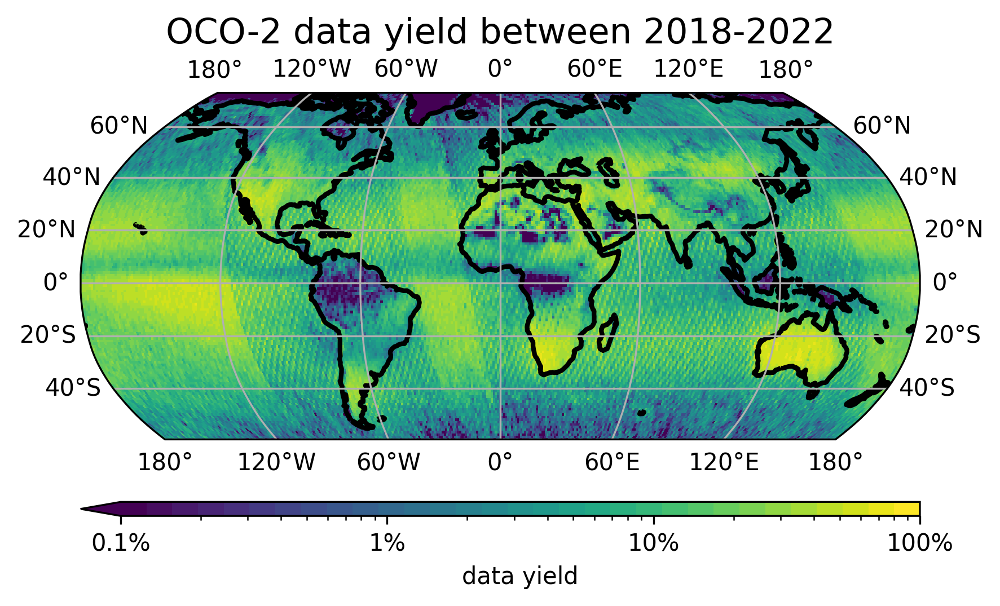

In [32]:
fig = plt.figure(dpi=300)
ax = plt.subplot(projection= ccrs.Robinson())


bounds = np.linspace(0, 1, 32)
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)
# Create a colormap
cmap = plt.get_cmap('viridis', len(bounds)-1)
ax.set_extent([-179.9, 179.9, -60, 75], crs=ccrs.PlateCarree())
f = OCO2_Yield_annual.plot(norm=colors.LogNorm(vmin=1e-3, vmax=1),transform=ccrs.PlateCarree(),cmap=cmap,rasterized=True,ax=ax,add_colorbar=False)
# f = OCO2_Yield_annual.plot(norm=colors.LogNorm(vmin=1e-3, vmax=1),transform=ccrs.PlateCarree(),cmap=cmap,cbar_kwargs={'pad':100,'orientation':'horizontal','label':''},ax=axs['all_regions'])
ax.coastlines(lw=2)
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
ax.set_title('OCO-2 data yield between 2018-2022',fontsize=15,)
cbar = fig.colorbar(f, ax=ax, orientation='horizontal', pad=0.1, aspect=60,extend='min',label='data yield')
cbar.set_ticklabels([f'{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )
cbar.set_ticklabels([f'{"" if i*100 %1 !=0 else ""}{int(i*100) if i*100 % 1 ==0 else i*100}%' for i in cbar.get_ticks()] )


[Text(0.5, 0, 'cloud free fraction'), Text(0, 0.5, 'count')]

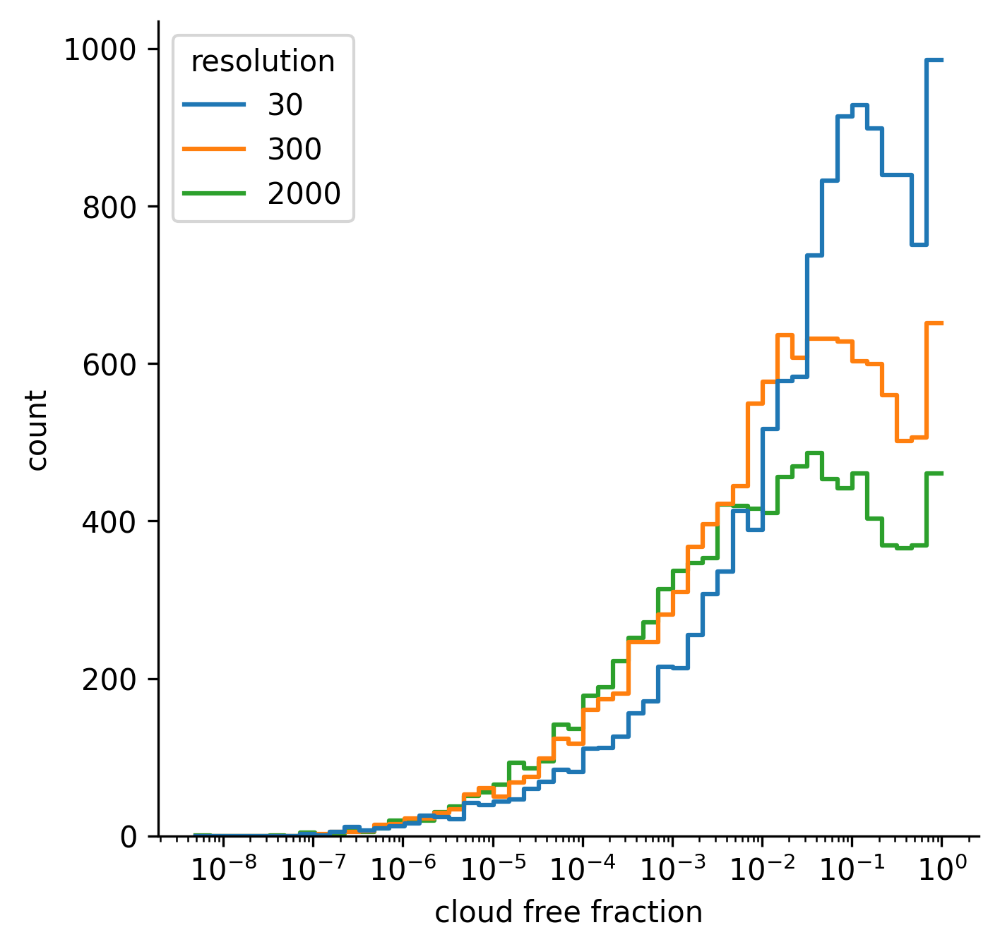

In [20]:
from matplotlib.lines import Line2D

cols = S2_df_final.columns[S2_df_final.columns.str.startswith('cloud_free_fraction')]
plot_df = S2_df_final[list(cols)+['system:index','res','dry_wet']]
plot_df = plot_df.replace({400:30,1000:300})
plot_df = plot_df[plot_df['res']!=5000]
plot_df['res'] = plot_df['res'].astype(int)
plot_df.columns = ['0%','0.04%','0.2%','1%','ID','resolution','season']
plot_df = plot_df.loc[plot_df['season'] != 'nan',['0.04%','0.2%','1%','ID','resolution','season']]
plot_df.set_index('ID',inplace=True)
fig, ax =plt.subplots(dpi=300,figsize=(5,5))
sns.histplot(data = plot_df[['0.2%','resolution']],x='0.2%',hue='resolution',bins=50,log_scale=(True,False),fill=False,element='step',palette='tab10')

# despline figure
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set(xlabel='cloud free fraction',ylabel='count')

In [34]:
OCO2_Yield_raw = (OCO2_L2_raw_monthly +1e-10) / (OCO2_L1B_monthly)
OCO2_Yield = (OCO2_L2_monthly +1e-10) / (OCO2_L1B_monthly)
OCO_raw = OCO2_Yield_raw.where(OCO2_Yield_raw<np.inf).drop('spatial_ref').to_dataframe()['__xarray_dataarray_variable__'].dropna()
OCO = OCO2_Yield.where(OCO2_Yield<np.inf).drop('spatial_ref').to_dataframe()['__xarray_dataarray_variable__'].dropna()

In [35]:
S2_df02_2000 = S2_df02[S2_df02['res']==2000]
S2_df02_2000['month'] = S2_df02_2000['time'].dt.month
S2_stats = S2_df02_2000.groupby(['month','lat','lon'])['cloud_free_fraction02'].mean()
S2_stats.index.names = ['month','y','x']

/tmp/ipykernel_2693206/1876648751.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  S2_df02_2000['month'] = S2_df02_2000['time'].dt.month


ValueError: Cannot calculate a linear regression if all x values are identical

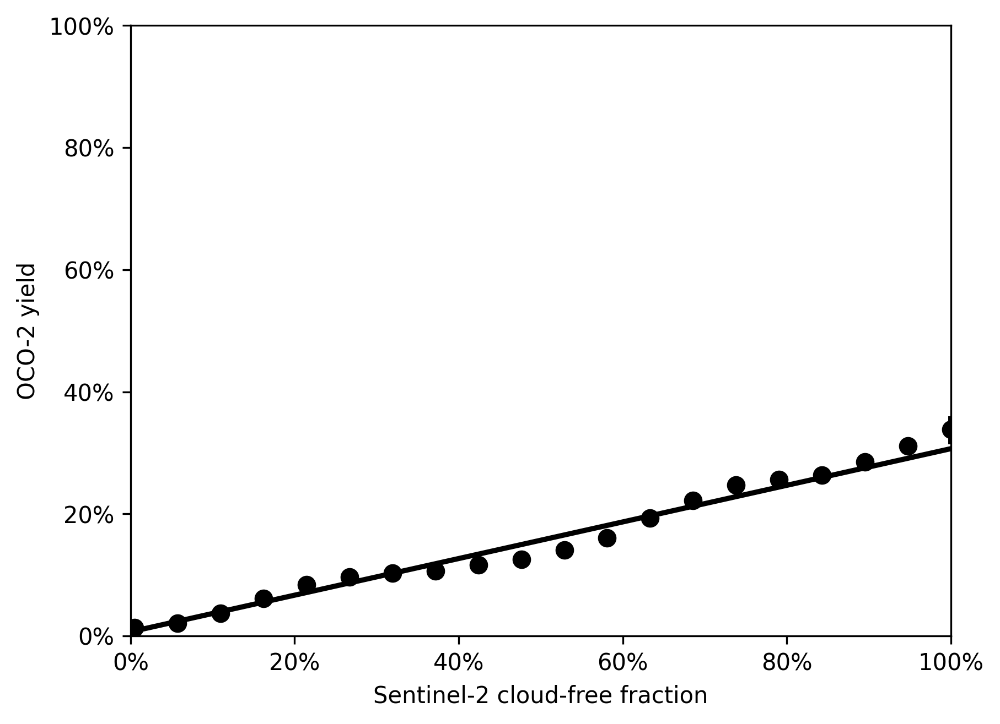

In [37]:
merged = pd.concat([OCO,OCO_raw,S2_stats],axis=1).dropna()
merged.columns = ['OCO','OCO_raw','S2']

fig,ax = plt.subplots(dpi=300)
g = sns.regplot(data=merged,x='S2',y='OCO',ax=ax,x_bins=np.linspace(10**-2.3,1,20),color='k')
# ax.plot([0,1],[0,1],'k--')
ax.set(xlim=[0,1],ylim=[0,1],ylabel='OCO-2 yield',xlabel='Sentinel-2 cloud-free fraction')
ax.xaxis.set_major_formatter(PercentFormatter(1,0))
ax.yaxis.set_major_formatter(PercentFormatter(1,0))


Text(0.05, 0.9, 'y = 0.3x')

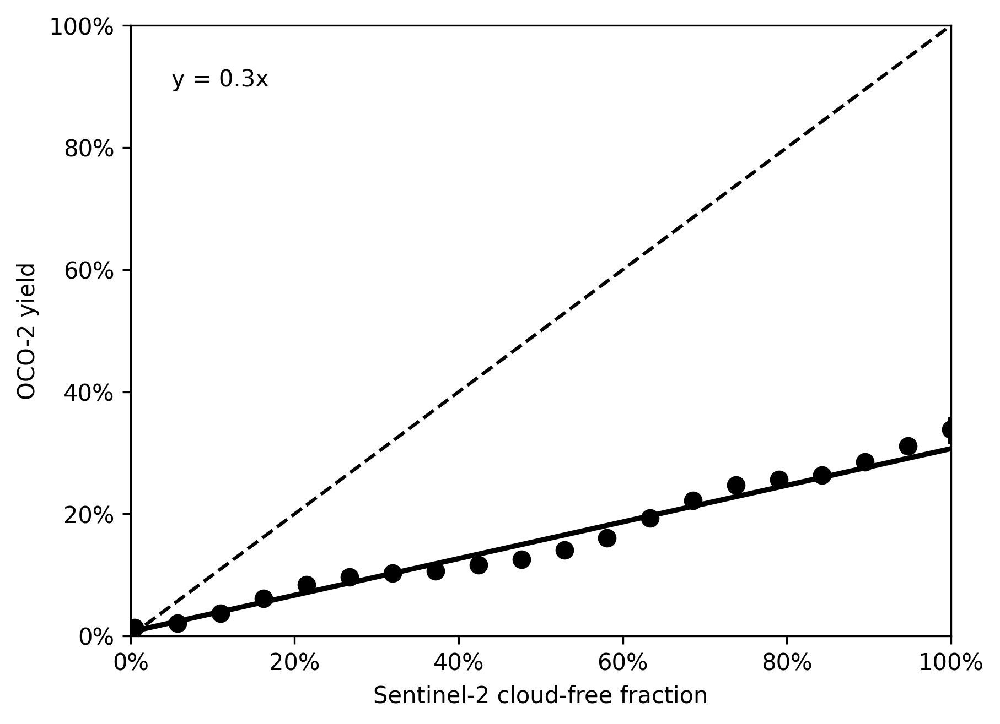

In [26]:
merged = pd.concat([OCO,OCO_raw,S2_stats],axis=1).dropna()
merged.columns = ['OCO','OCO_raw','S2']

fig,ax = plt.subplots(dpi=300)
g = sns.regplot(data=merged,x='S2',y='OCO',ax=ax,x_bins=np.linspace(10**-2.3,1,20),color='k')
ax.plot([0,1],[0,1],'k--')
ax.set(xlim=[0,1],ylim=[0,1],ylabel='OCO-2 yield',xlabel='Sentinel-2 cloud-free fraction')
ax.xaxis.set_major_formatter(PercentFormatter(1,0))
ax.yaxis.set_major_formatter(PercentFormatter(1,0))

import scipy
x = g.get_lines()[-2].get_xdata()
y = g.get_lines()[-2].get_ydata()
slope, intercept, r, p, sterr = scipy.stats.linregress(x=x,
                                                       y=y)

ax.text(0.05,0.9,f'y = {slope:.1f}x',transform=ax.transAxes)

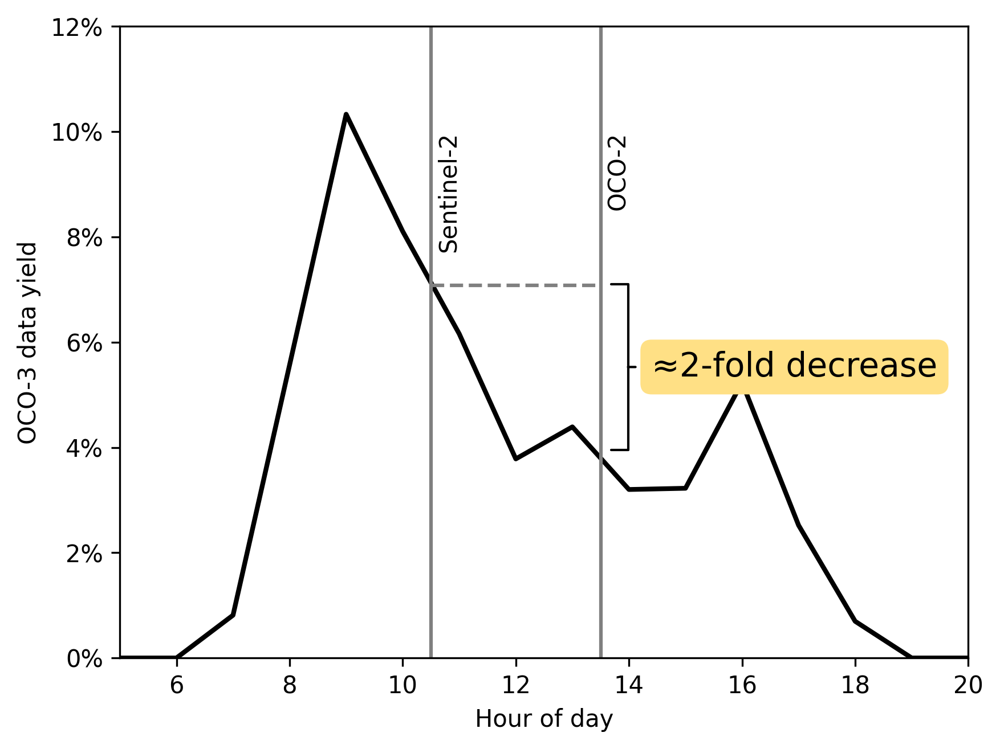

In [92]:
# define regions of interest
region_names = ['amazon','congo','sea']
regions = [[-78, -52, -5, 2],
    [7, 25, -5, 2],
    [90, 160, -5, 2],
        ]

box_to_polygon = lambda box : Polygon([ [box[0],box[2]], [box[0],box[3]], [box[1],box[3]],[box[1],box[2]],  [box[0],box[2]] ])
regions_gdf = gpd.GeoDataFrame(geometry=[box_to_polygon(box) for box in regions], crs="epsg:4326")
region = regions_gdf[:1]

OCO3_L1B_hourly.rio.write_crs("epsg:4326", inplace=True)
OCO3_L2_hourly.rio.write_crs("epsg:4326", inplace=True)
OCO3_L2_hourly_raw.rio.write_crs("epsg:4326", inplace=True)
OCO3_L1B_hourly_amazon = OCO3_L1B_hourly.where(OCO3_L1B_hourly>0).rio.clip(region.geometry.values, region.crs)
OCO3_L2_hourly_amazon = OCO3_L2_hourly.where(OCO3_L2_hourly>0).rio.clip(region.geometry.values, region.crs)
OCO3_L2_hourly_raw_amazon = OCO3_L2_hourly_raw.where(OCO3_L2_hourly_raw>0).rio.clip(region.geometry.values, region.crs)
fig,ax = plt.subplots(dpi=300)

data = (OCO3_L2_hourly_raw_amazon.sum(['x','y'])/OCO3_L1B_hourly_amazon.sum(dim=['x','y'])).drop('spatial_ref').fillna(0)#.to_dataframe()
from scipy.interpolate import interp1d

intp = interp1d(data.hour_cor,data.values,kind='cubic')

data.plot(ax=ax,lw=2,color='k')
# (OCO3_L2_hourly_amazon.sum(['x','y'])/OCO3_L1B_hourly_amazon.sum(dim=['x','y'])).drop('spatial_ref').fillna(0).plot(ax=ax,lw=2,color='Indianred')
ax.yaxis.set_major_formatter(PercentFormatter(1,0))

ax.set(xlabel='Hour of day',ylabel='OCO-3 data yield',xlim=[5,20],ylim=[0,0.12])
ax.axvline(10.5,color='grey')
ax.axvline(13.5,color='grey')
ax.text(10.6,0.1,'Sentinel-2',rotation=90,va='top')
ax.text(13.6,0.1,'OCO-2',rotation=90,va='top')
# plt.legend(['before stringent quality filtering','after stringent quality filtering'],loc='upper left')
from matplotlib.patches import FancyArrowPatch

bracketstyle = f"]-, angleA=0"
mid = (intp(10.5)+intp(13.5))/2
bracket = FancyArrowPatch((13.9,mid),(14.2,mid), arrowstyle=bracketstyle,
                              mutation_scale=35)
ax.add_patch(bracket)
ax.text(14.4, mid, '≈2-fold decrease', ha="left", va="center", fontsize=14,bbox=dict(boxstyle="round",
                   ec='#ffe085',
                   fc='#ffe085',
                   ))
ax.axhline(intp(10.5),xmin=(10.5-5)/(20-5),xmax=(13.5-5)/(20-5),color='grey',ls='--')

In [38]:
#load data
box_df = pd.read_feather('/home/ymbaron/data/cloud_effect/GE_BOX2.feather')
plot_df = box_df.groupby('res')['cloud_free_fraction1'].quantile([0.2,0.5,0.8]).unstack()
plot_df = plot_df.drop(index=[60,120])

# calc median
S2_ds_median = S2_df.groupby(['lat','lon','time','res'])[['cloud_free_fraction1','cloud_free_fraction5']].median().to_xarray()
# S2_ds_median = S2_df02.groupby(['lat','lon','time','res'])['cloud_free_fraction02'].median().to_xarray()
S2_ds_median.rio.write_crs("epsg:4326", inplace=True)
S2_ds_median = S2_ds_median.rename({'lat':'y','lon':'x'})
S2_season_median = S2_ds_median


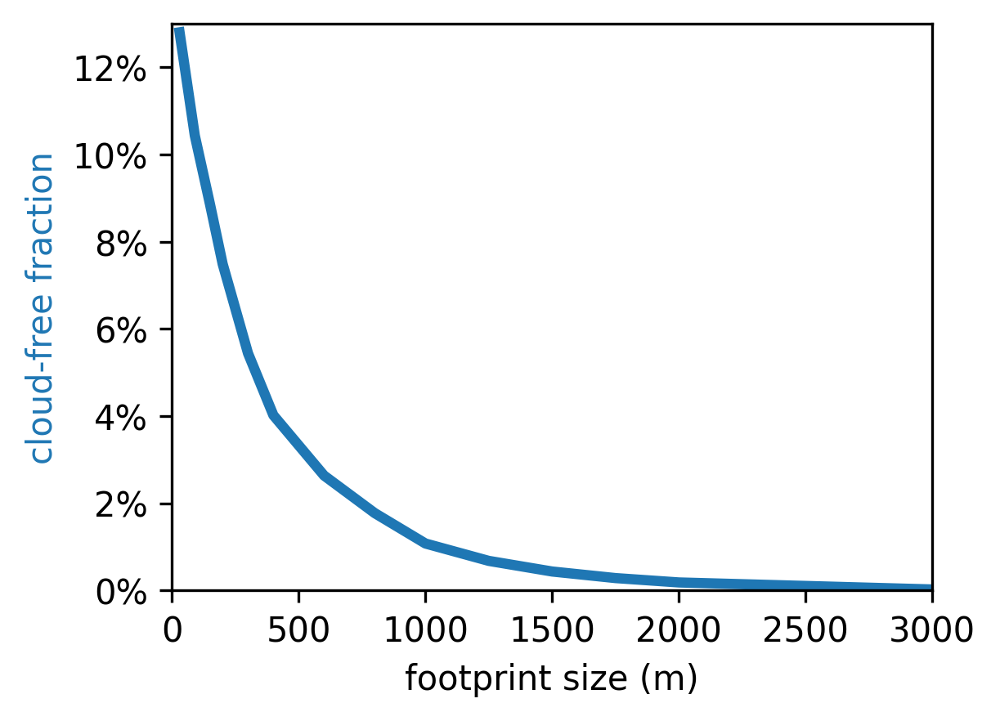

In [39]:




# plot
fig,ax = plt.subplots(dpi=300,figsize=(4,3))
# gs = gridspec.GridSpec(1, 2, width_ratios=[1, 3])

# fig a
# ax = plt.subplot(gs[0])
plot_df[0.5].plot(ax=ax,lw=3)
ax.set(ylim=[0,0.13],xlabel='footprint size (m)',xlim=[0,3000])
ax.set_ylabel('cloud-free fraction',color='C00')
ax.yaxis.set_major_formatter(PercentFormatter(1,0))
# despline

In [40]:
plot_df.index[13]

3000.0

Text(0, 0.5, 'relative revisit time (-)')

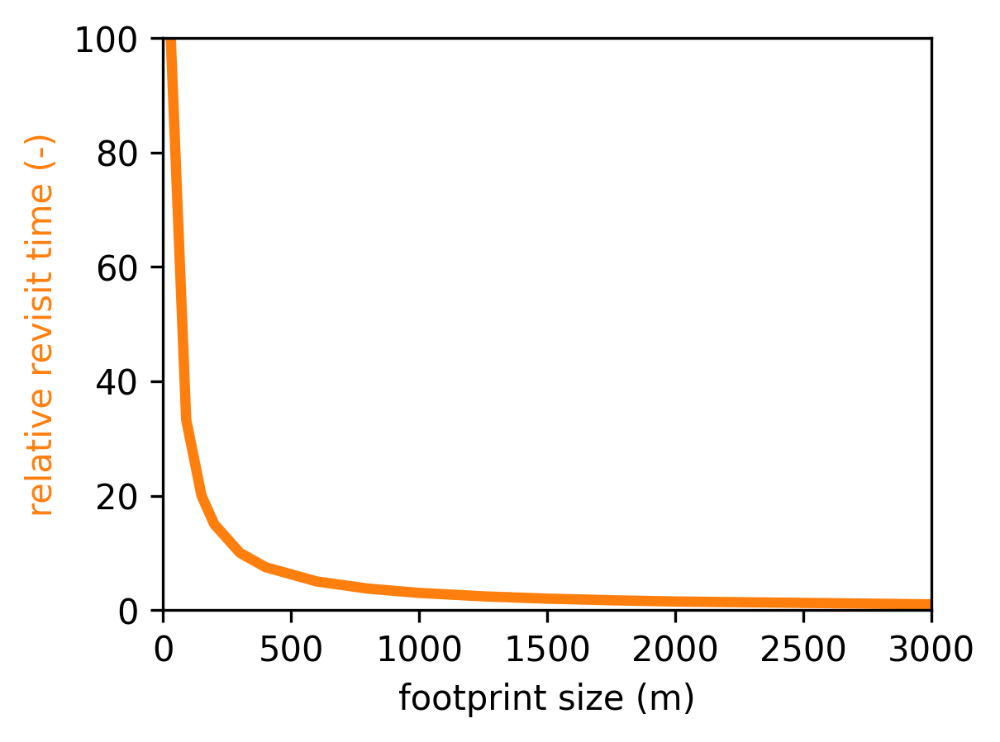

In [41]:
fig,ax = plt.subplots(dpi=300,figsize=(4,3))
# calculate revisit time
spatial_elements = 1000;
swath = spatial_elements*plot_df[0.5].index
revisit = 40075e3/(swath*15)

ax.plot(plot_df[0.5].index,revisit/revisit[13],c='C01',lw=3)
ax.set(ylim=[0,100],xlabel='footprint size (m)',xlim=[0,3000])
ax.set_ylabel('relative revisit time (-)',color='C01')
# ax.yaxis.set_major_formatter(PercentFormatter(1,0))


Text(320, 1.2, 'optimal footprint range')

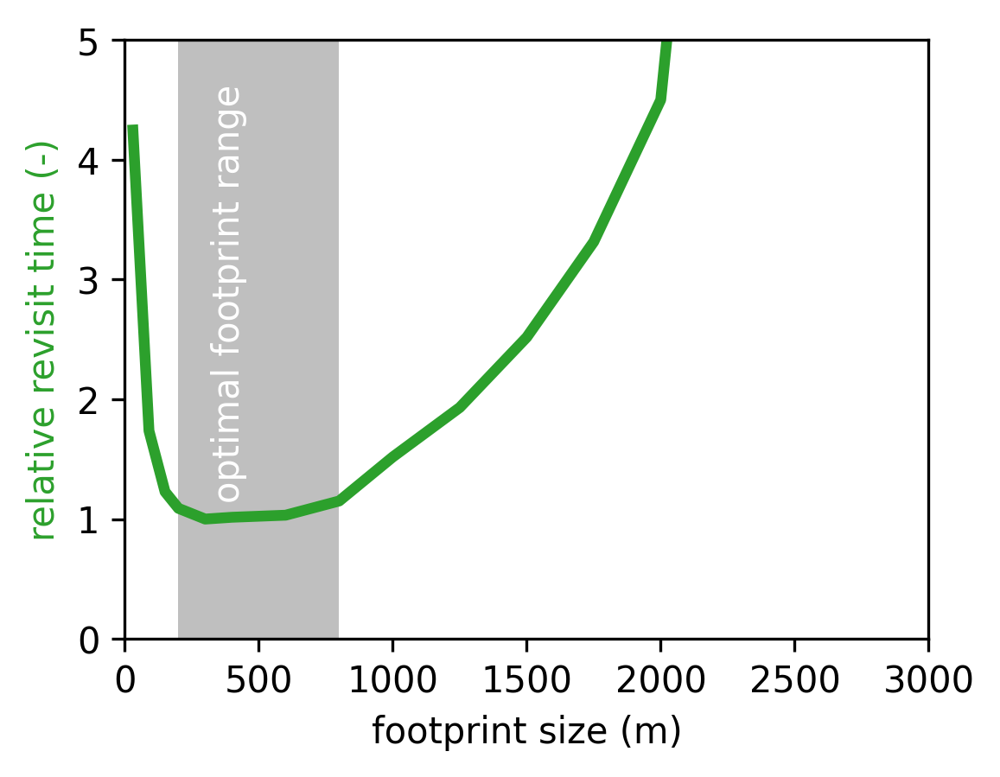

In [52]:
eff_rev = revisit/plot_df[0.5]
eff_rev = eff_rev/eff_rev.min()
eff_rev[eff_rev>1e10] = 1e3

fig,ax = plt.subplots(dpi=300,figsize=(4,3))
ax.plot(plot_df[0.5].index,eff_rev,c='C02',lw=3)
ax.set(ylim=[0,5])
ax.set_ylabel('relative revisit time (-)',color='C02')
ax.set(ylim=[0,5],xlabel='footprint size (m)',xlim=[0,3000])
# ax.axvline(300,ls='--',color='grey')
ax.fill_betweenx([0,5],200,800,alpha=0.5,color='grey',lw=0)
ax.text(320,1.2,'optimal footprint range',color='white',rotation=90)


/tmp/ipykernel_76425/2258666006.py:23: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.set_ticklabels([f'>{int(i)}' if i>=3000 else int(i) for i in cbar.get_ticks()] )


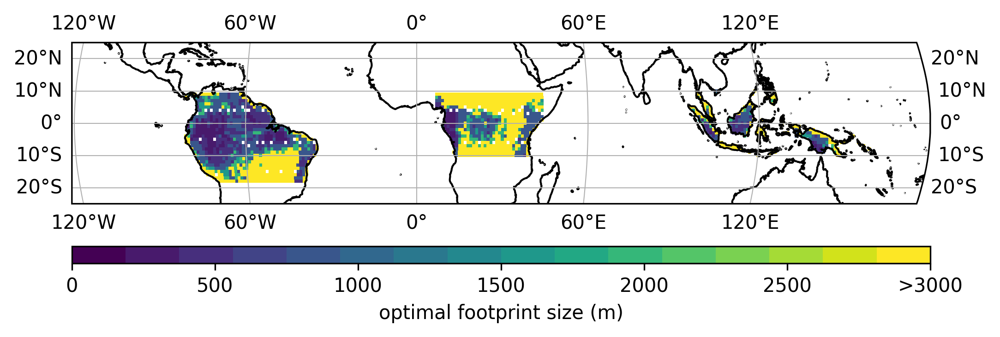

In [147]:
# map
fig = plt.figure(dpi=300,figsize=(8,4))
ax1 = plt.subplot(1,1,1,projection=ccrs.Robinson())

ds_plot_median = S2_season_median.median(dim='time')
S2_ds_median_plot_da = ds_plot_median.reindex(new_coords,fill_value=np.nan).rio.clip(world_df.geometry.values, world_df.crs).drop('spatial_ref')
spatial_elements = 1000;
swath = spatial_elements*S2_ds_median_plot_da['res']
revisit = 40075e3/(swath*15)
# a = (revisit/S2_ds_median_plot_da).fillna(9999).argmin(dim='res')['cloud_free_fraction02']
a = (revisit/S2_ds_median_plot_da).fillna(9999).argmin(dim='res')['cloud_free_fraction1']
plot_da = xr.DataArray.from_series(a.to_series().replace({k:v for k,v in enumerate(S2_ds_median_plot_da['res'].values)}))
plot_da.rio.write_crs("epsg:4326", inplace=True);
# plot_da = plot_da.where(S2_ds_median_plot_da.sel(res=30)['cloud_free_fraction02'].notnull()).drop(['res','spatial_ref'])
plot_da = plot_da.where(S2_ds_median_plot_da.sel(res=30)['cloud_free_fraction1'].notnull()).drop(['res','spatial_ref'])


bounds = plot_df.index
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=256)
cmap = plt.get_cmap('viridis', len(bounds)-1)
m = plot_da.plot(ax=ax1,vmin=0,transform=ccrs.PlateCarree(),cbar_kwargs={'pad':0.1,'orientation':'horizontal','label':'optimal footprint size (m)','aspect':50},cmap=cmap)
cbar = m.colorbar
cbar.set_ticklabels([f'>{int(i)}' if i>=3000 else int(i) for i in cbar.get_ticks()] )
ax1.coastlines(lw=1)
ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False,lw=0.5)
ax1.set_extent([-120.9, 179.9, -25, 25], crs=ccrs.PlateCarree())
